In [1]:
! pip install git+https://github.com/OpenHydrology/lmoments3.git
! git clone https://github.com/kikocorreoso/scikit-extremes.git
! cd scikit-extremes

import os
os.chdir('scikit-extremes/')

! pip install -e .

  Cloning https://github.com/OpenHydrology/lmoments3.git to /tmp/pip-req-build-cdig23wa
  Running command git clone --filter=blob:none --quiet https://github.com/OpenHydrology/lmoments3.git /tmp/pip-req-build-cdig23wa
  Resolved https://github.com/OpenHydrology/lmoments3.git to commit 7e19f97c23019ca68cbd526b8bd417c412438f1c
  Preparing metadata (setup.py) ... done
fatal: destination path 'scikit-extremes' already exists and is not an empty directory.
Obtaining file:///home/jovyan/PlanetaryComputerExamples/Paper3/Paper3/Manuscript_final/scikit-extremes
  Preparing metadata (setup.py) ... done
  Attempting uninstall: scikit-extremes
    Found existing installation: scikit-extremes 0.0.1
    Uninstalling scikit-extremes-0.0.1:
      Successfully uninstalled scikit-extremes-0.0.1
  Running setup.py develop for scikit-extremes


In [2]:
import intake
import xarray as xr 
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from calendar import monthrange
import numpy as np
import cartopy
from tqdm import tqdm
from scipy import interpolate
import pandas as pd
import seaborn as sns
import os
#%config InlineBackend.figure_format='retina'

from matplotlib import gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable

dataframe (Dataframe) - contains CMIP6 intake json 

In [3]:
## Supplementary Fig 19
# Sensitivity_id 1: return period = 10, 
# Sensitivity_id 5: return period = 40

Sensitivity_id = 5
return_period = 40
Sr_lower_threshold = 105  # For South America
Sr_upper_threshold = 435
AF_Sr_lower_threshold = 105 # For Africa
AF_Sr_upper_threshold = 390 

In [4]:
###### Need to be run once

In [5]:
#################################

In [6]:
import intake
import xarray as xr 
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from calendar import monthrange
import numpy as np
import cartopy
from tqdm import tqdm
from scipy import interpolate
import pandas as pd
import seaborn as sns
import os
from scipy import stats
from scipy.stats import mannwhitneyu
#%config InlineBackend.figure_format='retina'

from matplotlib import gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

dataframe (Dataframe) - contains CMIP6 intake json 

In [7]:
historical_year_start = 2000
historical_year_end = 2014

future_year_start = 2086
future_year_end = 2100

In [8]:
parent_dir = '/home/jovyan/PlanetaryComputerExamples/Paper3/Paper3/Manuscript_final/Sensitivity/'
#parent_dir_sensitivity = '/home/jovyan/PlanetaryComputerExamples/Paper3/Paper3/Manuscript_final/Sensitivity/'
#Saving Sr under different scenarios

In [9]:
# necessary url
url = "https://storage.googleapis.com/cmip6/pangeo-cmip6.json"
# open the catalog
dataframe = intake.open_esm_datastore(url)

In [10]:
import warnings
warnings.filterwarnings("ignore")   

CMIP6_datasets = {}
df = {}
for var in ['evspsbl', 'pr']:
    models = dataframe.search(activity_id = ['CMIP','ScenarioMIP'], experiment_id=['historical','ssp126','ssp245','ssp370','ssp585'], variable_id= str(var), member_id='r1i1p1f1', table_id='Amon')
    CMIP6_datasets[str(var)] = models.to_dataset_dict(zarr_kwargs={"consolidated": True, "decode_times": True, "use_cftime": True})
    #---------Extracting the datasets
    keys = []
    for key in CMIP6_datasets[var].keys():
        keys.append(key);
    keys.sort()
    #---------Splitting the dataset in dataframe
    df1 = pd.DataFrame()
    for i in range(len(keys)):
        df2 = {'institution_id': keys[i].split('.')[1],'source_id': keys[i].split('.')[2],'experiment_id': keys[i].split('.')[3],
               'table_id': keys[i].split('.')[4],'grid_label': keys[i].split('.')[5]};
        df1 = df1.append(df2, ignore_index = True);
    df[str(var)] = df1


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'


In [11]:
df = df['evspsbl'][df['evspsbl']['source_id'].isin(df['pr']['source_id'])]

In [12]:
df_final = df.drop_duplicates('source_id').sort_values('source_id').reset_index(drop=True)[['institution_id','source_id','table_id','grid_label']]

In [13]:
df_final['historical'] = 0
df_final['ssp126'] = 0
df_final['ssp245'] = 0
df_final['ssp370'] = 0
df_final['ssp585'] = 0

In [14]:
for model in range(df_final.shape[0]):
    a = df.where((df['source_id'] == df_final.iloc[model,1])).dropna()['experiment_id'].unique()
    if ('historical' in a) == True:
        df_final.iloc[model, 4] = 1
    if ('ssp126' in a) == True:
        df_final.iloc[model, 5] = 1
        if df_final.iloc[model,1] == 'IITM-ESM':
            ## IITM-ESM: Only simulated from 2095-2098
            df_final.iloc[model, 5] = 0
    if ('ssp245' in a) == True:
        df_final.iloc[model, 6] = 1
    if ('ssp370' in a) == True:
        df_final.iloc[model, 7] = 1
        if df_final.iloc[model,1] == 'MPI-ESM-1-2-HAM':
            ## IITM-ESM: Only simulated from 2095-2098
            df_final.iloc[model, 7] = 0
    if ('ssp585' in a) == True:
        df_final.iloc[model, 8] = 1
        if df_final.iloc[model,1] == 'NorESM2-LM':
            # No Precipitation data for NORESM5-ssp585
            df_final.iloc[model, 8] = 0

In [15]:
df_final = df_final[(df_final.source_id != 'EC-Earth3-Veg')]

In [16]:
models_to_remove = np.array(df_final.where((df_final.ssp126==0) & (df_final.ssp245==0) & (df_final.ssp370==0) & (df_final.ssp585 == 0)).dropna()['source_id'])

In [17]:
for model in models_to_remove:
    df_final = df_final[(df_final.source_id != model)]

In [18]:
df_final = df_final.reset_index(drop=True)

In [19]:
df_final

,institution_id,source_id,table_id,grid_label,historical,ssp126,ssp245,ssp370,ssp585
0,CSIRO-ARCCSS,ACCESS-CM2,Amon,gn,1,1,1,1,1
1,CSIRO,ACCESS-ESM1-5,Amon,gn,1,1,0,0,1
2,AWI,AWI-CM-1-1-MR,Amon,gn,1,1,1,1,1
3,BCC,BCC-CSM2-MR,Amon,gn,1,1,1,1,1
4,CAS,CAS-ESM2-0,Amon,gn,1,1,1,1,1
5,NCAR,CESM2-WACCM,Amon,gn,1,1,1,1,1
6,CMCC,CMCC-CM2-SR5,Amon,gn,1,1,1,1,1
7,CMCC,CMCC-ESM2,Amon,gn,1,1,1,1,1
8,CCCma,CanESM5,Amon,gn,1,1,1,1,1
9,E3SM-Project,E3SM-1-1,Amon,gr,1,0,0,0,1


#### Running analysis

In [20]:
# For South America
lat_min, lat_max, lon_min, lon_max = [-35,15,270,330]
if (lon_min == 270) & (lon_max == 330):
    Country = 'South America'
else:
    Country = 'Check country'

### Empirical data

In [21]:
#os.chdir('/home/jovyan/PlanetaryComputerExamples/Paper3')
org_dir = '/home/jovyan/PlanetaryComputerExamples/Paper3/Paper3/Manuscript_final/'
Sr = xr.open_dataset(org_dir+'Empirical_data/Data_Rootzone-storage-capacity.nc').mle_gumbel[0]

# Interpolated data
new_lon = Sr.lon.values
new_lat = Sr.lat.values

In [22]:
Landuse_all = xr.open_dataset(org_dir+'Empirical_data/Landuse_resampled_0.25_lonlatbox.nc').sel(lat = slice(-50,50)).Band1

#Landuse with both forest and savanna
Landuse_with_savanna = Landuse_all.where((Landuse_all == 30) | (Landuse_all == 40) | (Landuse_all == 50) | (Landuse_all == 60) | (Landuse_all == 70) | (Landuse_all == 90) | (Landuse_all == 100) | (Landuse_all == 110) | (Landuse_all == 120) | (Landuse_all == 130) | (Landuse_all == 140) | (Landuse_all == 150))
## Landuse with only forest
Landuse = Landuse_all.where((Landuse_all == 40) | (Landuse_all == 50) | (Landuse_all == 60) | (Landuse_all == 70) | (Landuse_all == 90) | (Landuse_all == 100))
## landuse with only savanna
Landuse_only_savanna = Landuse_all.where((Landuse_all == 30) | (Landuse_all == 110) | (Landuse_all == 120) | (Landuse_all == 130) | (Landuse_all == 140) | (Landuse_all == 150))

In [23]:
def get_iqr_values(df_in, col_name):
    median = df_in[col_name].median()
    q1 = df_in[col_name].quantile(0.25) # 25th percentile / 1st quartile
    q3 = df_in[col_name].quantile(0.75) # 7th percentile / 3rd quartile
    iqr = q3-q1 #Interquartile range
    minimum  = q1-1.5*iqr # The minimum value or the |- marker in the box plot
    maximum = q3+1.5*iqr # The maximum value or the -| marker in the box plot
    return median, q1, q3, iqr, minimum, maximum

def get_iqr_text(df_in, col_name):
    median, q1, q3, iqr, minimum, maximum = get_iqr_values(df_in, col_name)
    text = f"median={median:.2f}, q1={q1:.2f}, q3={q3:.2f}, iqr={iqr:.2f}, minimum={minimum:.2f}, maximum={maximum:.2f}"
    return text

def remove_outliers(df_in, col_name):
    _, _, _, _, minimum, maximum = get_iqr_values(df_in, col_name)
    df_out = df_in.loc[(df_in[col_name] > minimum) & (df_in[col_name] < maximum)]
    return df_out

## For South America

Welch's t-test: https://towardsdatascience.com/the-statistical-analysis-t-test-explained-for-beginners-and-experts-fd0e358bbb62


Mann-Whitney U test 

In [24]:
## With percentile equivalent threhold

fig, ax = plt.subplots(7,5, figsize=(30,44.5), dpi = 200)
fig.subplots_adjust(bottom=0.02)
sec_y_eq_100 = []
sec_y_eq_400 = []
color = ['#2b8cbe','#2ca25f','#a6611a','#de2d26']
for model, ax in zip(range(df_final.shape[0]), ax.flat):
    os.chdir(parent_dir+'Sr_estimates/historical/')
    temp_name = 'CMIP.'+df_final.iloc[model,0]+'.'+df_final.iloc[model,1]+'.'+'historical'+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
    #if df_final.iloc[model,1] == 'MPI-ESM1-2-HR':
    #    temp_name = 'MPI-M'+'.'+df_final.iloc[model,1]+'.'+'historical'+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
    temp_name = 'Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.2000-2014.nc'
    CMIP6_Sr_interp_historical = xr.open_dataset(temp_name).Sr.interp(lat=new_lat, lon=new_lon)
    df = pd.DataFrame({'Sr': Sr.sel(lat = slice(lat_min,lat_max), 
                                        lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                        lon = slice(lon_min,lon_max)).values > 0).values.flatten(),
                           'Historical': CMIP6_Sr_interp_historical.sel(lat = slice(lat_min,lat_max), 
                                                             lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                             lon = slice(lon_min,lon_max)).values > 0).values.flatten()})
    SSP = 0
    for SSP in ['ssp126','ssp245','ssp370','ssp585']:
        if df_final[SSP].iloc[model] == 0:
            continue
        os.chdir(parent_dir+'Sr_estimates/'+SSP+'/')
        temp_name = 'ScenarioMIP.'+df_final.iloc[model,0]+'.'+df_final.iloc[model,1]+'.'+str(SSP)+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
        if (df_final.iloc[model,1] == 'MPI-ESM1-2-HR'):
            temp_name = 'ScenarioMIP.'+'DKRZ'+'.'+df_final.iloc[model,1]+'.'+str(SSP)+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
        if (df_final.iloc[model,1] == 'IITM-ESM'):
            if (SSP == 'ssp370'):
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2098)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
            else:
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2099)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        else: 
            CMIP6_Sr_interp_future = xr.open_dataset('Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(future_year_end)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        #print(temp_name)

        CMIP6_Sr_interp_future = CMIP6_Sr_interp_future.where(Landuse.values > 0)

        # Converting to dataframe for analysis for 'South America' 
        df[SSP] = CMIP6_Sr_interp_future.sel(lat = slice(lat_min,lat_max), 
                                                             lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                             lon = slice(lon_min,lon_max)).values > 0).values.flatten()
        
    df = df.dropna()
    df_random  = df.sample(3000)
    df_random = remove_outliers(df_random, 'Sr')
    df_random = remove_outliers(df_random, 'Historical')
    
    for SSP in ['ssp126','ssp245','ssp370','ssp585']:
        if df_final[SSP].iloc[model] == 0:
            continue
        df_random = remove_outliers(df_random, SSP)

    sz = df_random['Sr'].size-1
    df_random['Sr_percentile'] = df_random['Sr'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)    
    df_random['Historical_percentile'] = df_random['Historical'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)    
    Sr_percentile_100 = df_random.loc[df_random['Sr'].sub(Sr_lower_threshold).abs().idxmin()]['Sr_percentile']
    Historical_Sr_100 = df_random.loc[df_random['Historical_percentile'].sub(Sr_percentile_100).abs().idxmin()]['Historical']
    Sr_percentile_400 = df_random.loc[df_random['Sr'].sub(Sr_upper_threshold).abs().idxmin()]['Sr_percentile']
    Historical_Sr_400 = df_random.loc[df_random['Historical_percentile'].sub(Sr_percentile_400).abs().idxmin()]['Historical']

    newax = ax.twiny()
    newax.set_frame_on(True)
    newax.patch.set_visible(False)
    newax.xaxis.set_ticks_position('bottom')
    newax.xaxis.set_label_position('bottom')
    newax.spines['bottom'].set_position(('outward', 40))
    ax.axvline(Sr_lower_threshold, color = 'black', zorder = 2, alpha = 0.7)
    ax.axvline(Sr_upper_threshold, color = 'black', zorder = 2, alpha = 0.7)
    sns.distplot(df_random['Sr'] , color="black", bins = 100, ax = ax, label = 'Observed', hist=False)
    sns.distplot(df_random['Historical'] , color="black", bins = 100, ax = newax, hist=False, label = 'CMIP6-Historical', kde_kws={'linestyle':'--'})
    sec_y_eq_100.append(Historical_Sr_100)
    newax.axvline(Historical_Sr_100, color = 'black', linestyle = '--', zorder = 2, alpha = 0.9)
    Historical_Sr_100 = 0
    sec_y_eq_400.append(Historical_Sr_400)
    newax.axvline(Historical_Sr_400, color = 'black', linestyle = '--', zorder = 2, alpha = 0.9)
    Historical_Sr_400 = 0
    
    color_i = 0
    for SSP in ['ssp126','ssp245','ssp370','ssp585']:
        if df_final[SSP].iloc[model] == 0:
            color_i = color_i+1
            continue
        sns.distplot(df_random[SSP] , color=color[color_i], bins = 100, ax = newax, hist=False, label = 'CMIP6-Future')
        color_i = color_i+1
        ax.set_title(df_final.iloc[model,1], fontsize = '20', color = '#636363')
        sns.despine()
        ax.tick_params(axis='both', which='major', labelsize=20)
        plt.setp(ax.spines.values(), linewidth=1.5)
        ax.set_xlabel(' ')
        newax.tick_params(axis='x', which='major', labelsize=20)
        newax.spines['bottom'].set_color('dodgerblue')

        plt.setp(newax.spines.values(), linewidth=1.5)
        ax.set_ylabel(' ')
        newax.set_xlabel(' ')
    """
    ax.annotate('p = '+'{0:.3f}'.format(mannwhitneyu(df['Sr'].sample(2000), df['Historical'].sample(2000))[1]), xy=(0.89, 0.9), 
                    xycoords='axes fraction', style='italic', fontsize=20, ha='right', va='bottom', zorder = 5)
    """
    if (mannwhitneyu(df['Sr'].sample(2000), df['Historical'].sample(2000))[1] < 0.05):
        ax.annotate('p < 0.05', xy=(0.89, 0.9), xycoords='axes fraction', style='italic', fontsize=20, ha='right', va='bottom', zorder = 5, color = 'red')
    else:
        ax.annotate('p = '+'{0:.3f}'.format(mannwhitneyu(df['Sr'].sample(20), df['Historical'].sample(20))[1]), xy=(0.89, 0.9), 
                    xycoords='axes fraction', style='italic', fontsize=20, ha='right', va='bottom', zorder = 5)

df_final['Sr-100eq'] = np.array(sec_y_eq_100)
df_final['Sr-400eq'] = np.array(sec_y_eq_400)

fig.text(0.5, -0.01, 'Root zone storage capacity (mm)', ha='center', fontsize = 36)

fig.text(0.05, 1.01, 'Observation-based vs CMIP6-derived root zone storage capacity distribution for '+Country, fontsize = 36)
#fig.text(0.23735, 1.01, 'CMIP6-historical (2000-2014)', fontsize = 36, color = 'dodgerblue')
#fig.text(0.4858, 1.01, 'vs', fontsize = 36)
#fig.text(0.51, 1.01, 'CMIP6-'+SSP+' (2070-2100)', fontsize = 36, color = 'red') # Check the year
#fig.text(0.736, 1.01, ' for '+Country, fontsize = 36)

fig.text(-0.02, 0.5, 'Frequency density', va='center', rotation='vertical', fontsize = 36)
#fig.text(0.5,1.018, '(Percentile-relative)', ha='center', fontsize = 25, color = '#636363')
plt.tight_layout()
#fig.savefig(parent_dir+'/Figures/'+Country+'_Frequency_distribution (Observed vs Historical vs Future).svg', dpi=300, bbox_inches="tight")

In [25]:
df_final.to_csv(parent_dir+str(Sensitivity_id)+'_CMIP6-Future_models_all_(with Sr-eq)_'+Country+'.csv', index = False)

In [26]:
df_final = df_final.drop(['Sr-100eq', 'Sr-400eq'], axis = 1)

#### For Africa

In [27]:
# For South America
lat_min, lat_max, lon_min, lon_max = [-35,15,0,55]
if (lon_min == 0) & (lon_max == 55):
    Country = 'Africa'
else:
    Country = 'Check country'

In [28]:
## With percentile equivalent threhold

fig, ax = plt.subplots(7,5, figsize=(30,44.5), dpi = 200)
fig.subplots_adjust(bottom=0.02)
sec_y_eq_100 = []
sec_y_eq_400 = []
color = ['#2b8cbe','#2ca25f','#a6611a','#de2d26']
for model, ax in zip(range(df_final.shape[0]), ax.flat):
    os.chdir(parent_dir+'Sr_estimates/historical/')
    temp_name = 'CMIP.'+df_final.iloc[model,0]+'.'+df_final.iloc[model,1]+'.'+'historical'+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
    #if df_final.iloc[model,1] == 'MPI-ESM1-2-HR':
    #    temp_name = 'MPI-M'+'.'+df_final.iloc[model,1]+'.'+'historical'+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
    temp_name = 'Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.2000-2014.nc'
    CMIP6_Sr_interp_historical = xr.open_dataset(temp_name).Sr.interp(lat=new_lat, lon=new_lon)
    df = pd.DataFrame({'Sr': Sr.sel(lat = slice(lat_min,lat_max), 
                                        lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                        lon = slice(lon_min,lon_max)).values > 0).values.flatten(),
                           'Historical': CMIP6_Sr_interp_historical.sel(lat = slice(lat_min,lat_max), 
                                                             lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                             lon = slice(lon_min,lon_max)).values > 0).values.flatten()})
    SSP = 0
    for SSP in ['ssp126','ssp245','ssp370','ssp585']:
        if df_final[SSP].iloc[model] == 0:
            continue
        os.chdir(parent_dir+'Sr_estimates/'+SSP+'/')
        temp_name = 'ScenarioMIP.'+df_final.iloc[model,0]+'.'+df_final.iloc[model,1]+'.'+str(SSP)+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
        if (df_final.iloc[model,1] == 'MPI-ESM1-2-HR'):
            temp_name = 'ScenarioMIP.'+'DKRZ'+'.'+df_final.iloc[model,1]+'.'+str(SSP)+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
        if (df_final.iloc[model,1] == 'IITM-ESM'):
            if (SSP == 'ssp370'):
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2098)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
            else:
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2099)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        else: 
            CMIP6_Sr_interp_future = xr.open_dataset('Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(future_year_end)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        #print(temp_name)

        CMIP6_Sr_interp_future = CMIP6_Sr_interp_future.where(Landuse.values > 0)

        # Converting to dataframe for analysis for 'South America' 
        df[SSP] = CMIP6_Sr_interp_future.sel(lat = slice(lat_min,lat_max), 
                                                             lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                             lon = slice(lon_min,lon_max)).values > 0).values.flatten()
        
    df = df.dropna()
    df_random  = df.sample(3000)
    df_random = remove_outliers(df_random, 'Sr')
    df_random = remove_outliers(df_random, 'Historical')
    
    for SSP in ['ssp126','ssp245','ssp370','ssp585']:
        if df_final[SSP].iloc[model] == 0:
            continue
        df_random = remove_outliers(df_random, SSP)

    sz = df_random['Sr'].size-1
    df_random['Sr_percentile'] = df_random['Sr'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)    
    df_random['Historical_percentile'] = df_random['Historical'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)    
    Sr_percentile_100 = df_random.loc[df_random['Sr'].sub(AF_Sr_lower_threshold).abs().idxmin()]['Sr_percentile']
    Historical_Sr_100 = df_random.loc[df_random['Historical_percentile'].sub(Sr_percentile_100).abs().idxmin()]['Historical']
    Sr_percentile_400 = df_random.loc[df_random['Sr'].sub(AF_Sr_upper_threshold).abs().idxmin()]['Sr_percentile']
    Historical_Sr_400 = df_random.loc[df_random['Historical_percentile'].sub(Sr_percentile_400).abs().idxmin()]['Historical']

    newax = ax.twiny()
    newax.set_frame_on(True)
    newax.patch.set_visible(False)
    newax.xaxis.set_ticks_position('bottom')
    newax.xaxis.set_label_position('bottom')
    newax.spines['bottom'].set_position(('outward', 40))
    ax.axvline(AF_Sr_lower_threshold, color = 'black', zorder = 2, alpha = 0.7)
    ax.axvline(AF_Sr_upper_threshold, color = 'black', zorder = 2, alpha = 0.7)
    sns.distplot(df_random['Sr'] , color="black", bins = 100, ax = ax, label = 'Observed', hist=False)
    sns.distplot(df_random['Historical'] , color="black", bins = 100, ax = newax, hist=False, label = 'CMIP6-Historical', kde_kws={'linestyle':'--'})
    sec_y_eq_100.append(Historical_Sr_100)
    newax.axvline(Historical_Sr_100, color = 'black', linestyle = '--', zorder = 2, alpha = 0.9)
    Historical_Sr_100 = 0
    sec_y_eq_400.append(Historical_Sr_400)
    newax.axvline(Historical_Sr_400, color = 'black', linestyle = '--', zorder = 2, alpha = 0.9)
    Historical_Sr_400 = 0
    
    color_i = 0
    for SSP in ['ssp126','ssp245','ssp370','ssp585']:
        if df_final[SSP].iloc[model] == 0:
            color_i = color_i+1
            continue
        sns.distplot(df_random[SSP] , color=color[color_i], bins = 100, ax = newax, hist=False, label = 'CMIP6-Future')
        color_i = color_i+1
        ax.set_title(df_final.iloc[model,1], fontsize = '20', color = '#636363')
        sns.despine()
        ax.tick_params(axis='both', which='major', labelsize=20)
        plt.setp(ax.spines.values(), linewidth=1.5)
        ax.set_xlabel(' ')
        newax.tick_params(axis='x', which='major', labelsize=20)
        newax.spines['bottom'].set_color('dodgerblue')

        plt.setp(newax.spines.values(), linewidth=1.5)
        ax.set_ylabel(' ')
        newax.set_xlabel(' ')
    """
    ax.annotate('p = '+'{0:.3f}'.format(mannwhitneyu(df['Sr'].sample(2000), df['Historical'].sample(2000))[1]), xy=(0.89, 0.9), 
                    xycoords='axes fraction', style='italic', fontsize=20, ha='right', va='bottom', zorder = 5)
    """
    if (stats.ks_2samp(df['Sr'].sample(200), df['Historical'].sample(200), alternative='two-sided', mode='auto')[1] < 0.05):
        ax.annotate('p < 0.05', xy=(0.89, 0.9), xycoords='axes fraction', style='italic', fontsize=20, ha='right', va='bottom', zorder = 5, color = 'red')
    else:
        ax.annotate('p = '+'{0:.3f}'.format(stats.ks_2samp(df['Sr'].sample(200), df['Historical'].sample(200), alternative='two-sided', mode='auto')[1]), xy=(0.89, 0.9), 
                    xycoords='axes fraction', style='italic', fontsize=20, ha='right', va='bottom', zorder = 5)

df_final['Sr-100eq'] = np.array(sec_y_eq_100)
df_final['Sr-350eq'] = np.array(sec_y_eq_400)

fig.text(0.5, -0.01, 'Root zone storage capacity (mm)', ha='center', fontsize = 36)

fig.text(0.05, 1.01, 'Observation-based vs CMIP6-derived root zone storage capacity distribution for '+Country, fontsize = 36)
#fig.text(0.23735, 1.01, 'CMIP6-historical (2000-2014)', fontsize = 36, color = 'dodgerblue')
#fig.text(0.4858, 1.01, 'vs', fontsize = 36)
#fig.text(0.51, 1.01, 'CMIP6-'+SSP+' (2070-2100)', fontsize = 36, color = 'red') # Check the year
#fig.text(0.736, 1.01, ' for '+Country, fontsize = 36)

fig.text(-0.02, 0.5, 'Frequency density', va='center', rotation='vertical', fontsize = 36)
#fig.text(0.5,1.018, '(Percentile-relative)', ha='center', fontsize = 25, color = '#636363')
plt.tight_layout()
#fig.savefig(parent_dir+'/Figures/'+Country+'_Frequency_distribution (Observed vs Historical vs Future).svg', dpi=300, bbox_inches="tight")


In [29]:
df_final.to_csv(parent_dir+str(Sensitivity_id)+'_CMIP6-Future_models_all_(with Sr-eq)_'+Country+'.csv', index = False)

In [30]:
historical_year_start = 2000
historical_year_end = 2014

future_year_start = 2086
future_year_end = 2100

In [31]:
parent_dir = '/home/jovyan/PlanetaryComputerExamples/Paper3/Paper3/Manuscript_final/Sensitivity/'

In [32]:
# necessary url
url = "https://storage.googleapis.com/cmip6/pangeo-cmip6.json"
# open the catalog
dataframe = intake.open_esm_datastore(url)

In [33]:
import warnings
warnings.filterwarnings("ignore")   

CMIP6_datasets = {}
df = {}
for var in ['evspsbl', 'pr']:
    models = dataframe.search(activity_id = ['CMIP','ScenarioMIP'], experiment_id=['historical','ssp126','ssp245','ssp370','ssp585'], variable_id= str(var), member_id='r1i1p1f1', table_id='Amon')
    CMIP6_datasets[str(var)] = models.to_dataset_dict(zarr_kwargs={"consolidated": True, "decode_times": True, "use_cftime": True})
    #---------Extracting the datasets
    keys = []
    for key in CMIP6_datasets[var].keys():
        keys.append(key);
    keys.sort()
    #---------Splitting the dataset in dataframe
    df1 = pd.DataFrame()
    for i in range(len(keys)):
        df2 = {'institution_id': keys[i].split('.')[1],'source_id': keys[i].split('.')[2],'experiment_id': keys[i].split('.')[3],
               'table_id': keys[i].split('.')[4],'grid_label': keys[i].split('.')[5]};
        df1 = df1.append(df2, ignore_index = True);
    df[str(var)] = df1


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'


### Empirical data

In [34]:
#os.chdir('/home/jovyan/PlanetaryComputerExamples/Paper3')
Sr = xr.open_dataset(org_dir+'Empirical_data/Data_Rootzone-storage-capacity.nc').mle_gumbel[0]

# Interpolated data
new_lon = Sr.lon.values
new_lat = Sr.lat.values

In [35]:
Landuse_all = xr.open_dataset(org_dir+'Empirical_data/Landuse_resampled_0.25_lonlatbox.nc').sel(lat = slice(-50,50)).Band1

#Landuse with both forest and savanna
Landuse_with_savanna = Landuse_all.where((Landuse_all == 30) | (Landuse_all == 40) | (Landuse_all == 50) | (Landuse_all == 60) | (Landuse_all == 70) | (Landuse_all == 90) | (Landuse_all == 100) | (Landuse_all == 110) | (Landuse_all == 120) | (Landuse_all == 130) | (Landuse_all == 140) | (Landuse_all == 150))
## Landuse with only forest
Landuse = Landuse_all.where((Landuse_all == 40) | (Landuse_all == 50) | (Landuse_all == 60) | (Landuse_all == 70) | (Landuse_all == 90) | (Landuse_all == 100))
## landuse with only savanna
Landuse_only_savanna = Landuse_all.where((Landuse_all == 30) | (Landuse_all == 110) | (Landuse_all == 120) | (Landuse_all == 130) | (Landuse_all == 140) | (Landuse_all == 150))

#### Defining functions

In [36]:
def get_iqr_values(df_in, col_name):
    median = df_in[col_name].median()
    q1 = df_in[col_name].quantile(0.25) # 25th percentile / 1st quartile
    q3 = df_in[col_name].quantile(0.75) # 7th percentile / 3rd quartile
    iqr = q3-q1 #Interquartile range
    minimum  = q1-1.5*iqr # The minimum value or the |- marker in the box plot
    maximum = q3+1.5*iqr # The maximum value or the -| marker in the box plot
    return median, q1, q3, iqr, minimum, maximum

def get_iqr_text(df_in, col_name):
    median, q1, q3, iqr, minimum, maximum = get_iqr_values(df_in, col_name)
    text = f"median={median:.2f}, q1={q1:.2f}, q3={q3:.2f}, iqr={iqr:.2f}, minimum={minimum:.2f}, maximum={maximum:.2f}"
    return text

def remove_outliers(df_in, col_name):
    _, _, _, _, minimum, maximum = get_iqr_values(df_in, col_name)
    df_out = df_in.loc[(df_in[col_name] > minimum) & (df_in[col_name] < maximum)]
    return df_out

In [37]:
#Funtion to calulate days per month as a constant funtion (needs to be multiplied to CMIP6-precipitation estimates)
def sum_of_day(year_start, year_end, lat_1, lon_2):
    sum_of_day = []
    year = 0
    for year in range(year_start,year_end+1):
        for month in range(1,13):
            sum_of_day.append(monthrange(year, month)[1]*(np.ones((lat_1, lon_2)))*86400)
    sum_of_day = (np.array(sum_of_day))
    return sum_of_day

In [38]:
def calc_Seasonality(data):
    # Input is monthly data of precipitation
    Seasonality = []
    for lat in range(data.shape[1]):
        for lon in range(data.shape[2]):
            Seasonality.append(((1/data[:,lat,lon].sum())*(np.array([abs((data[i,lat,lon]-(data[:,lat,lon].sum()/12))) for i in range(12)]).sum())))
    Seasonality = (np.array(Seasonality).reshape(data.shape[1],data.shape[2]))
    return Seasonality

In [39]:
def interp_selfilter(file, Landuse,lat_min,lat_max,lon_min,lon_max):
    if isinstance(file,(np.ndarray)):
        file = xr.DataArray(file, coords=[lat, lon], dims=['lat', 'lon'], name = 'Variable', 
                            attrs=dict(description="Check the variable", units="Unit"))
        file = file.interp(lat=new_lat, lon=new_lon)
        file = file.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                      lon = slice(lon_min,lon_max)).values > 0)
    else:
        file = file.interp(lat=new_lat, lon=new_lon)
        file = file.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                      lon = slice(lon_min,lon_max)).values > 0)
    return file

In [40]:
def boxplot_custom(order, data, ax=None, **kwargs):
    ax = ax or plt.gca()
    data = remove_outliers(data, data.columns[0])
    ax.plot([data.quantile(0.25)[0], data.quantile(0.75)[0]], [order, order], **kwargs, lw = 2.5, color = 'black', zorder=1)
    ax.plot([data.quantile(0.025)[0], data.quantile(0.975)[0]], [order, order], **kwargs, lw = 1, color = 'black', zorder=0)
    #ax.plot([(data.quantile(0.25)[0]-1.5*(data.quantile(0.75)[0]-data.quantile(0.25)[0])), 
    #        (data.quantile(0.75)[0]+1.5*(data.quantile(0.75)[0]-data.quantile(0.25)[0]))], [0,0], **kwargs, lw = 1, color = 'black', zorder=0) 
    ax.scatter(data.median(), order, **kwargs, s = 150, edgecolors = 'black', lw = 2.5, facecolor = '#8c6bb1', zorder=2);
    ax.tick_params(axis='x', which='major', labelsize=15)
    ax.get_yaxis().set_ticks([])
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    plt.tight_layout()
    return data.quantile(0.025)[0], data.quantile(0.25)[0], data.quantile(0.75)[0], data.quantile(0.975)[0];

In [41]:
def forest_dataframe(lat_min,lat_max,lon_min,lon_max):
    multi_year_monthly_prec = xr.open_dataset(org_dir+'Empirical_data/chirps-v2.0.2000-2012.meanmonthly_p25.nc').precip.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    Landuse_sel = Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    MeanTC_sel = (xr.open_dataset(org_dir+'Empirical_data/Treecover_MOD44B_2001-2012.nc').treecover.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))).mean(axis = 0)
    Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))

    dataframe = pd.concat([#pd.concat([pd.DataFrame({'treecover_'+str(2001+i): annual_tree_cover[i].values.flatten()}) for i in range(12)], axis = 1),
            #pd.concat([pd.DataFrame({'water_deficit_'+str(2001+i): annual_water_deficit[i].values.flatten()}) for i in range(12)], axis = 1),
            pd.concat([pd.DataFrame({'Precip_month_'+str(1+i): multi_year_monthly_prec[i].values.flatten()}) for i in range(12)], axis = 1),
                       pd.DataFrame({'Landuse': Landuse_sel.values.flatten()}), pd.DataFrame({'MeanTC': MeanTC_sel.values.flatten()}),
                       pd.DataFrame({'Sr': Sr_sel.values.flatten()})], axis = 1).dropna()

    seasonality = []
    for i in range(dataframe.filter(like='Precip').shape[0]):
        data = (dataframe.filter(like='Precip').iloc[i,:])
        seasonality.append((1/data.sum())*(np.array([abs((data[i]-(data.sum()/12))) for i in range(12)]).sum()))
    seasonality = np.array(seasonality).flatten()
    dataframe['Seasonality'] = seasonality
    dataframe['Precip'] = (dataframe.filter(like='Precip').dropna()).sum(axis = 1)
    """
    df_full = pd.DataFrame({'Precip_yearly': (dataframe.filter(like='Precip').dropna()).sum(axis = 1), 
              'Seasonality': seasonality})
    """
    dataframe = remove_outliers(dataframe, 'Precip')
    dataframe = remove_outliers(dataframe, 'Seasonality')
    sz = dataframe['Precip'].size-1
    dataframe['Precip_percentile'] = dataframe['Precip'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)    
    dataframe['Seasonality_percentile'] = dataframe['Seasonality'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)
    dataframe = dataframe[['Sr','Precip','Seasonality','Precip_percentile','Seasonality_percentile']]
    dataframe = dataframe.sample(round(dataframe.shape[0]/10*2))
    return dataframe

In [42]:
def savanna_dataframe(lat_min,lat_max,lon_min,lon_max):
    multi_year_monthly_prec = xr.open_dataset(org_dir+'Empirical_data/chirps-v2.0.2000-2012.meanmonthly_p25.nc').precip.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    Landuse_only_savanna_sel = Landuse_only_savanna.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    MeanTC_sel = (xr.open_dataset(org_dir+'Empirical_data/Treecover_MOD44B_2001-2012.nc').treecover.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))).mean(axis = 0)
    Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))

    dataframe = pd.concat([#pd.concat([pd.DataFrame({'treecover_'+str(2001+i): annual_tree_cover[i].values.flatten()}) for i in range(12)], axis = 1),
        #pd.concat([pd.DataFrame({'water_deficit_'+str(2001+i): annual_water_deficit[i].values.flatten()}) for i in range(12)], axis = 1),
        pd.concat([pd.DataFrame({'Precip_month_'+str(1+i): multi_year_monthly_prec[i].values.flatten()}) for i in range(12)], axis = 1),
                   pd.DataFrame({'Landuse': Landuse_only_savanna_sel.values.flatten()}), pd.DataFrame({'MeanTC': MeanTC_sel.values.flatten()}),
                   pd.DataFrame({'Sr': Sr_sel.values.flatten()})], axis = 1).dropna()
    
    seasonality = []
    for i in range(dataframe.filter(like='Precip').shape[0]):
        data = (dataframe.filter(like='Precip').iloc[i,:])
        seasonality.append((1/data.sum())*(np.array([abs((data[i]-(data.sum()/12))) for i in range(12)]).sum()))
    seasonality = np.array(seasonality).flatten()
    dataframe['Seasonality'] = seasonality
    dataframe['Precip'] = (dataframe.filter(like='Precip').dropna()).sum(axis = 1)
    dataframe = dataframe[['Sr','Precip','Seasonality']]
    dataframe = remove_outliers(dataframe, 'Precip')
    dataframe = remove_outliers(dataframe, 'Seasonality')
    dataframe = dataframe.sample(round(dataframe.shape[0]/10*2))
    return dataframe

In [43]:
def combined_classification_all_WSf_future(SSP,CMIP6_class_all_forest_savanna_corrected, Forest_class):
    i = 0
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lon.values
    for i in range(0,a_temp.shape[0]):
        B = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]]
        if 'LWSf' == Forest_class:
            C = B.where((B == 1) | (B == 4) | (B == 7))
        if 'MWSf' == Forest_class:
            C = B.where((B == 2) | (B == 5) | (B == 8))
        if 'HWSf' == Forest_class:
            C = B.where((B == 3) | (B == 6) | (B == 9))
        if 'Tipping' == Forest_class:
            C = B.where((B == 11) | (B == 12) | (B == 13))
        #else:
        #    print('Check', Forest_class)
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/a_temp.shape[0], coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [44]:
def combined_classification_all_WSf_future_custom(SSP,CMIP6_class_all_forest_savanna_corrected, Forest_class_1, Forest_class_2, Forest_class_3):
    i = 0
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lon.values
    for i in range(0,a_temp.shape[0]):
        B = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]]
        C = B.where((B == Forest_class_1) | (B == Forest_class_2) | (B == Forest_class_3))
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/a_temp.shape[0], coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [45]:
def barchart_area_classes(CMIP6_class_all_forest_savanna_corrected, SSP, forest_class, Sr_lower_threshold, Sr_upper_threshold, lat_min, lat_max, lon_min, lon_max, ax=None, **kwargs):
    area = []
    a = combined_classification_all_WSf_future(SSP, CMIP6_class_all_forest_savanna_corrected,forest_class)
    Area = xr.open_dataset(org_dir+'Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    High_CI = Area.where(a.values > 0.5).sum().values
    area.append(High_CI)
    Mod_CI = Area.where((a.values > 0.2) & (a.values <= 0.5)).sum().values
    area.append(Mod_CI)
    Low_CI = Area.where(a.values <= 0.2).sum().values
    area.append(Low_CI)
    area = np.array(area)/1000000 ## km2x 10^6
    Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    if forest_class == 'LWSf':
        SR_area = Area.where(Sr_sel.values <= Sr_lower_threshold).sum().values
    if forest_class == 'MWSf':
        SR_area = Area.where((Sr_sel.values > Sr_lower_threshold) & (Sr_sel.values <= Sr_upper_threshold)).sum().values
    if forest_class == 'HWSf':
        SR_area = Area.where(Sr_sel.values > Sr_upper_threshold).sum().values
    if forest_class == 'Tipping':
        SR_area = 0
    
    import matplotlib.patches as patches
    ax = ax or plt.gca()
    color = ['#018571','#d8b365','#bababa']
    
    a,b,c = area
    rect0 = patches.Rectangle((0, 0), 10, SR_area/1000000, ec = 'black', lw = 1, **kwargs, hatch="\\\\", fill=False, zorder = 10)
    rect1 = patches.Rectangle((0, 0), 10, a, color = color[0], ec = 'black', lw = 1, **kwargs)
    rect2 = patches.Rectangle((0, a), 10, b, color = color[1], ec = 'black', lw = 1, **kwargs)
    rect3 = patches.Rectangle((0, a+b), 10, c, color = color[2], ec = 'black', lw = 1, **kwargs)
    
    ax.add_patch(rect0)
    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    ax.plot([0,-15],[SR_area/1000000,SR_area/1000000], color = 'black', **kwargs)
    #ax.plot([0,25],[a,a], color = 'black', **kwargs)
    #ax.plot([15,40],[a+b,a+b], color = 'black', **kwargs)

    #ax.set_xlim([-10, 100])
    #ax.set_ylim([-10, 700])
    
    ax.tick_params(axis='both', which='major', labelsize=15)
    ax.get_xaxis().set_ticks([])
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.yaxis.set_label_position("right")
    ax.set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax.set_xlim([-3, 10])
    ax.set_ylim([0, 9])
    ax.yaxis.tick_right()

In [46]:
def barchart_area_classes_custom(CMIP6_class_all_forest_savanna_corrected, SSP, Forest_class_1, Forest_class_2, Forest_class_3,lat_min, lat_max, lon_min, lon_max, ax=None, **kwargs):
    area = []
    a = combined_classification_all_WSf_future_custom(SSP, CMIP6_class_all_forest_savanna_corrected, Forest_class_1, Forest_class_2, Forest_class_3)
    Area = xr.open_dataset(org_dir+'Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    High_CI = Area.where(a.values > 0.5).sum().values
    area.append(High_CI)
    Mod_CI = Area.where((a.values > 0.2) & (a.values <= 0.5)).sum().values
    area.append(Mod_CI)
    Low_CI = Area.where(a.values <= 0.2).sum().values
    area.append(Low_CI)
    area = np.array(area)/1000000 ## km2x 10^6

    import matplotlib.patches as patches
    ax = ax or plt.gca()
    color = ['#018571','#d8b365','#bababa']

    a,b,c = area
    rect1 = patches.Rectangle((0, 0), 10, a, color = color[0], ec = 'black', lw = 1)
    rect2 = patches.Rectangle((0, a), 10, b, color = color[1], ec = 'black', lw = 1)
    rect3 = patches.Rectangle((0, a+b), 10, c, color = color[2], ec = 'black', lw = 1)
    
    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    
    ax.tick_params(axis='both', which='major', labelsize=15)
    ax.get_xaxis().set_ticks([])
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.yaxis.set_label_position("right")
    ax.set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax.set_xlim([-3, 10])
    ax.set_ylim([0, 9])
    ax.yaxis.tick_right()

In [47]:
def Forest_savanna_transition(CMIP6_class_array_org, Precip_historical_array, Seasonality_historical_array, 
                              Precip_future_array, Seasonality_future_array):
    Tipping_class = 0
    Non_Tipping_class = 0
    lat = Precip_future_array.lat
    lon = Precip_future_array.lon
    Precip_historical_array = Precip_historical_array.values
    Seasonality_historical_array = Seasonality_historical_array.values
    Precip_future_array = Precip_future_array.values
    Seasonality_future_array = Seasonality_future_array.values
    CMIP6_class_array_corrected = np.zeros((Precip_future_array.shape[0], Precip_future_array.shape[1]))
    CMIP6_class_array_corrected[:] = np.nan
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_org[row, column]):
                continue
            if (CMIP6_class_array_org[row, column] >= 1) & (CMIP6_class_array_org[row, column] <= 3):
                Tipping_class = 11
            if (CMIP6_class_array_org[row, column] >= 4) & (CMIP6_class_array_org[row, column] <= 6):
                Tipping_class = 12
            if (CMIP6_class_array_org[row, column] >= 7) & (CMIP6_class_array_org[row, column] <= 9):
                Tipping_class = 13
            if (Precip_future_array[row, column] <= Prec_025_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_future_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_future_array[row, column] <= Seasonality_025_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_future_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_future_array[row, column] > Seasonality_975_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            else:
                CMIP6_class_array_corrected[row, column] = CMIP6_class_array_org[row, column]
    
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_corrected[row, column]):
                continue
            if (CMIP6_class_array_corrected[row, column] >= 11) & (CMIP6_class_array_corrected[row, column] <= 13):
                if (CMIP6_class_array_corrected[row, column] == 11):
                    Non_Tipping_class = 991
                if (CMIP6_class_array_corrected[row, column] == 12):
                    Non_Tipping_class = 992
                if (CMIP6_class_array_corrected[row, column] == 13):
                    Non_Tipping_class = 993
                if (Precip_historical_array[row, column] <= Prec_025_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
                if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_historical_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_historical_array[row, column] <= Seasonality_025_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
                if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_historical_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_historical_array[row, column] > Seasonality_975_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
    
    CMIP6_class_array_corrected = xr.DataArray(CMIP6_class_array_corrected, coords=[lat, lon], dims=['lat', 'lon'], name = 'Variable', 
                            attrs=dict(description="Check the variable", units="Unit/Dimentionless"))
    if np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) == np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)):
        #print('All regions accounted')
        1+1
    else:
        print('Unaccounted pixels:', np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) - np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)))
        ## Total pixel count ~ 10000
    return CMIP6_class_array_corrected

In [48]:
# For South America
lat_min, lat_max, lon_min, lon_max = [-35,15,270,330]
if (lon_min == 270) & (lon_max == 330):
    Country = 'South America'
else:
    Country = 'Check country'

South America (Total Area) = 8216635.38904723 km^2

In [49]:
df_final = pd.read_csv(parent_dir+str(Sensitivity_id)+'_CMIP6-Future_models_all_(with Sr-eq)_South America.csv')

In [50]:
df_final

,institution_id,source_id,table_id,grid_label,historical,ssp126,ssp245,ssp370,ssp585,Sr-100eq,Sr-400eq
0,CSIRO-ARCCSS,ACCESS-CM2,Amon,gn,1,1,1,1,1,148.241883,487.967887
1,CSIRO,ACCESS-ESM1-5,Amon,gn,1,1,0,0,1,133.937051,366.815328
2,AWI,AWI-CM-1-1-MR,Amon,gn,1,1,1,1,1,165.449636,522.414526
3,BCC,BCC-CSM2-MR,Amon,gn,1,1,1,1,1,107.477294,440.695653
4,CAS,CAS-ESM2-0,Amon,gn,1,1,1,1,1,135.827843,380.266932
5,NCAR,CESM2-WACCM,Amon,gn,1,1,1,1,1,201.296986,496.785420
6,CMCC,CMCC-CM2-SR5,Amon,gn,1,1,1,1,1,172.547422,317.651631
7,CMCC,CMCC-ESM2,Amon,gn,1,1,1,1,1,167.909518,316.263584
8,CCCma,CanESM5,Amon,gn,1,1,1,1,1,232.064772,392.558757
9,E3SM-Project,E3SM-1-1,Amon,gr,1,0,0,0,1,189.049218,375.123753


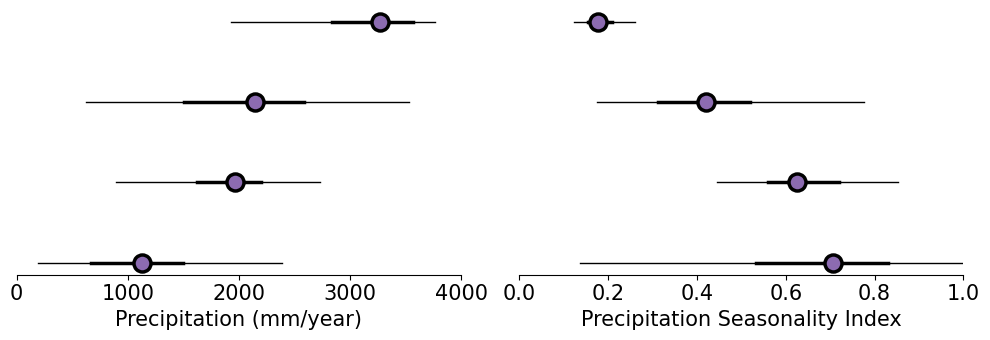

In [51]:
fig, ax = plt.subplots(1,2, figsize=(10,3.5))
dataframe_forest = forest_dataframe(lat_min,lat_max,lon_min,lon_max)
dataframe_sav = savanna_dataframe(lat_min,lat_max,lon_min,lon_max)
for i,var in zip([0,1], ['Precip', 'Seasonality']):
    boxplot_custom(3, pd.DataFrame(dataframe_forest[str(var)].where(dataframe_forest['Sr'] <= Sr_lower_threshold).dropna()), ax = ax[i])
    boxplot_custom(2, pd.DataFrame(dataframe_forest[str(var)].where((dataframe_forest['Sr'] > Sr_lower_threshold) & (dataframe_forest['Sr'] < Sr_upper_threshold)).dropna()), ax = ax[i])
    boxplot_custom(1, pd.DataFrame(dataframe_forest[str(var)].where(dataframe_forest['Sr'] >= Sr_upper_threshold).dropna()), ax = ax[i])
    boxplot_custom(0, pd.DataFrame(dataframe_sav[str(var)]), ax = ax[i])

ax[0].set_xlim(0,4000)
ax[1].set_xlim(0,1)
ax[0].set_xlabel('Precipitation (mm/year)', fontsize = 15)
ax[1].set_xlabel('Precipitation Seasonality Index', fontsize = 15)
plt.tight_layout()

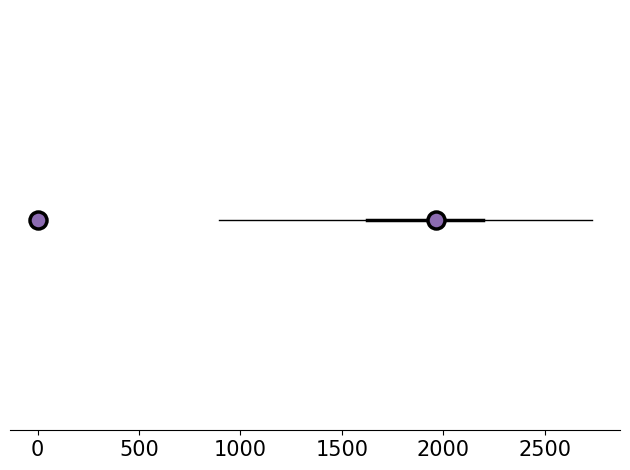

In [52]:
Precip_025,Precip_25,Precip_75,Precip_975 = boxplot_custom(1, pd.DataFrame(dataframe_forest['Precip'].where(dataframe_forest['Sr'] >= Sr_upper_threshold).dropna()))
Seasonality_025,Seasonality_25,Seasonality_75,Seasonality_975 = boxplot_custom(1, pd.DataFrame(dataframe_forest['Seasonality'].where(dataframe_forest['Sr'] >= Sr_upper_threshold).dropna()))

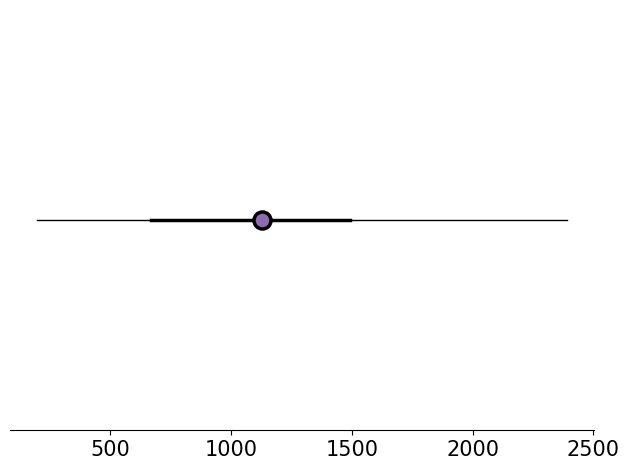

In [53]:
_,_,sav_Precip_75,_ = boxplot_custom(1, pd.DataFrame(dataframe_sav['Precip'].dropna()))

In [54]:
Prec_percentile_025 = dataframe_forest.loc[dataframe_forest['Precip'].sub(Precip_025).abs().idxmin()]['Precip_percentile']
Prec_percentile_25 = dataframe_forest.loc[dataframe_forest['Precip'].sub(Precip_25).abs().idxmin()]['Precip_percentile']

Seasonality_percentile_025 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_025).abs().idxmin()]['Seasonality_percentile']
Seasonality_percentile_975 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_975).abs().idxmin()]['Seasonality_percentile']

In [55]:
sav_Prec_percentile_75 = dataframe_forest.loc[dataframe_forest['Precip'].sub(sav_Precip_75).abs().idxmin()]['Precip_percentile']

Seasonality_percentile_25 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_25).abs().idxmin()]['Seasonality_percentile']
Seasonality_percentile_75 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_75).abs().idxmin()]['Seasonality_percentile']

In [56]:
Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)

------------

In [57]:
CMIP6_class_all = {}

for SSP in ['ssp126','ssp245','ssp370','ssp585']:
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    for i in tqdm(range(a_temp.shape[0])):
        os.chdir(parent_dir+'/Sr_estimates/historical/')
        temp_name = 'CMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+'historical'+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        CMIP6_Sr_interp_historical = xr.open_dataset('Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.2000-2014.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_historical = CMIP6_Sr_interp_historical.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                          lon = slice(lon_min,lon_max)).values > 0)
        CMIP6_Sr_interp_historical.close()

        os.chdir(parent_dir+'/Sr_estimates/'+SSP+'/')
        temp_name = 'ScenarioMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+SSP+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'MPI-ESM1-2-HR'):
            temp_name = 'ScenarioMIP.'+'DKRZ'+'.'+a_temp.iloc[i,1]+'.'+str(SSP)+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'IITM-ESM'):
            if (SSP == 'ssp370'):
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2098)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
            else:
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2099)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        else:
            CMIP6_Sr_interp_future = xr.open_dataset('Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(future_year_end)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_future = CMIP6_Sr_interp_future.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max),
                                                                                                                                          lon = slice(lon_min,lon_max)).values > 0)
        CMIP6_Sr_interp_future.close()

        """
        ### Saving rootzone storage capacity change as classes 1-9 (forest-savanna tansitions not included)
        """
        CMIP6_Sr_class = {}
        CMIP6_Sr_class['1'] = Sr_sel.where((Sr_sel.values <= Sr_lower_threshold) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,9]))
        CMIP6_Sr_class['2'] = Sr_sel.where((Sr_sel.values <= Sr_lower_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,9]) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,10]))
        CMIP6_Sr_class['3'] = Sr_sel.where((Sr_sel.values <= Sr_lower_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,10]))
        CMIP6_Sr_class['4'] = Sr_sel.where((Sr_sel > Sr_lower_threshold) & (Sr_sel <= Sr_upper_threshold) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,9]))
        CMIP6_Sr_class['5'] = Sr_sel.where((Sr_sel > Sr_lower_threshold) & (Sr_sel <= Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,9]) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,10]))
        CMIP6_Sr_class['6'] = Sr_sel.where((Sr_sel > Sr_lower_threshold) & (Sr_sel <= Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,10]))
        CMIP6_Sr_class['7'] = Sr_sel.where((Sr_sel > Sr_upper_threshold) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,9]))
        CMIP6_Sr_class['8'] = Sr_sel.where((Sr_sel > Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,9]) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,10]))
        CMIP6_Sr_class['9'] = Sr_sel.where((Sr_sel > Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,10]))

        for class_number in range(1,10):
            CMIP6_Sr_class[str(class_number)] = (CMIP6_Sr_class[str(class_number)].fillna(0)/CMIP6_Sr_class[str(class_number)].fillna(0))*class_number
        CMIP6_Sr_class = (CMIP6_Sr_class['1'].fillna(0)+CMIP6_Sr_class['2'].fillna(0)+CMIP6_Sr_class['3'].fillna(0)+CMIP6_Sr_class['4'].fillna(0)+CMIP6_Sr_class['5'].fillna(0)+CMIP6_Sr_class['6'].fillna(0)+
                          CMIP6_Sr_class['7'].fillna(0)+CMIP6_Sr_class['8'].fillna(0)+CMIP6_Sr_class['9'].fillna(0))
        CMIP6_Sr_class = CMIP6_Sr_class.where(CMIP6_Sr_class > 0)
        CMIP6_class_all[SSP+'.'+str(a_temp.iloc[i,1])] = CMIP6_Sr_class

100%|██████████| 30/30 [00:02<00:00, 10.30it/s]


In [58]:
#Interesting trends-4,5,15,22

SA_CMIP6_class_all_forest_savanna_corrected = {}
for SSP in ['ssp126','ssp245','ssp370','ssp585']:
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    for i in tqdm(range(a_temp.shape[0])):
        CMIP6_Sr_class = CMIP6_class_all[SSP+'.'+a_temp.iloc[i,1]]
        # -----------
        os.chdir(parent_dir+'/Sr_estimates/historical/')
        temp_name = 'CMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+'historical'+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        CMIP6_Sr_interp_historical = xr.open_dataset('Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.2000-2014.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_historical = CMIP6_Sr_interp_historical.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                              lon = slice(lon_min,lon_max)).values > 0)
        CMIP6_Sr_interp_historical.close()

        CMIP6_prec_historical = 0
        CMIP6_prec_historical = (CMIP6_datasets['pr'][temp_name]).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max), time = slice(str(historical_year_start),str(historical_year_end))).pr[0]
        CMIP6_prec_yearly_historical = CMIP6_prec_historical*sum_of_day(historical_year_start,historical_year_end,CMIP6_prec_historical.shape[1],CMIP6_prec_historical.shape[2])
        CMIP6_prec_monthly_historical_mean = (CMIP6_prec_yearly_historical.groupby('time.month').mean('time'))
        CMIP6_prec_yearly_historical_mean = (CMIP6_prec_yearly_historical.groupby('time.month').mean('time')).sum(axis = 0)
        CMIP6_prec_monthly_historical_mean = CMIP6_prec_monthly_historical_mean.values

        CMIP6_evap_historical = 0
        CMIP6_evap_historical = (CMIP6_datasets['evspsbl'][temp_name]).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max), time = slice(str(historical_year_start),str(historical_year_end))).evspsbl[0]
        CMIP6_evap_yearly_historical = CMIP6_evap_historical*sum_of_day(historical_year_start,historical_year_end,CMIP6_evap_historical.shape[1],CMIP6_evap_historical.shape[2])
        CMIP6_evap_yearly_historical_mean = (CMIP6_evap_yearly_historical.groupby('time.month').mean('time')).sum(axis = 0)
        ####

        ####    
        os.chdir(parent_dir+'/Sr_estimates/'+SSP+'/')
        temp_name = 'ScenarioMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+SSP+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'MPI-ESM1-2-HR'):
            temp_name = 'ScenarioMIP.'+'DKRZ'+'.'+a_temp.iloc[i,1]+'.'+str(SSP)+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'IITM-ESM'):
            if (SSP == 'ssp370'):
                #CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2098)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
                future_year_end = 2098
            else:
                future_year_end = 2099
                #CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2099)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_future = xr.open_dataset('Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(future_year_end)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_future = CMIP6_Sr_interp_future.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max),
                                                                                                                                              lon = slice(lon_min,lon_max)).values > 0)
        CMIP6_Sr_interp_future.close()


        CMIP6_prec_future = 0
        CMIP6_prec_future = (CMIP6_datasets['pr'][temp_name]).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max), time = slice(str(future_year_start),str(future_year_end))).pr[0]
        CMIP6_prec_monthly_future = CMIP6_prec_future*sum_of_day(future_year_start,future_year_end,CMIP6_prec_future.shape[1],CMIP6_prec_future.shape[2])
        CMIP6_prec_monthly_future_mean = CMIP6_prec_monthly_future.groupby('time.month').mean('time')
        CMIP6_prec_yearly_future_mean = CMIP6_prec_monthly_future_mean.sum(axis = 0)
        CMIP6_prec_monthly_future_mean = CMIP6_prec_monthly_future_mean.values

        CMIP6_evap_future = 0
        CMIP6_evap_future = (CMIP6_datasets['evspsbl'][temp_name]).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max), time = slice(str(future_year_start),str(future_year_end))).evspsbl[0]
        CMIP6_evap_yearly_future = CMIP6_evap_future*sum_of_day(future_year_start,future_year_end,CMIP6_evap_future.shape[1],CMIP6_evap_future.shape[2])
        CMIP6_evap_yearly_future_mean = CMIP6_evap_yearly_future.groupby('time.month').mean('time').sum(axis = 0)
        ####

        Seasonality_historical = calc_Seasonality(CMIP6_prec_monthly_historical_mean)
        Seasonality_future = calc_Seasonality(CMIP6_prec_monthly_future_mean)
        lat = CMIP6_prec_yearly_future_mean.lat.values
        lon = CMIP6_prec_yearly_future_mean.lon.values

        Prec_CHIRPS = xr.open_dataset(org_dir+'Empirical_data/chirps-v2.0.2000-2012.meanmonthly_p25.nc').precip.sum(axis = 0).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)); Prec_CHIRPS = Prec_CHIRPS.where(Prec_CHIRPS>0)
        #MeanTC_sel = (xr.open_dataset('/home/jovyan/PlanetaryComputerExamples/Paper3/Treecover_MOD44B_2001-2012.nc').treecover.mean(axis = 0)).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
        Seasonality_historical = interp_selfilter(Seasonality_historical, Landuse,lat_min, lat_max, lon_min, lon_max) 
        Seasonality_future = interp_selfilter(Seasonality_future, Landuse,lat_min, lat_max, lon_min, lon_max)
        CMIP6_prec_yearly_historical_mean = interp_selfilter(CMIP6_prec_yearly_historical_mean, Landuse,lat_min, lat_max, lon_min, lon_max)
        CMIP6_prec_yearly_future_mean = interp_selfilter(CMIP6_prec_yearly_future_mean, Landuse,lat_min, lat_max, lon_min, lon_max)

        CMIP6_evap_yearly_historical_mean = interp_selfilter(CMIP6_evap_yearly_historical_mean, Landuse,lat_min, lat_max, lon_min, lon_max)
        CMIP6_evap_yearly_future_mean = interp_selfilter(CMIP6_evap_yearly_future_mean, Landuse,lat_min, lat_max, lon_min, lon_max)

        dataframe_variables = 0
        dataframe_variables = pd.concat([pd.DataFrame({'Precip_Observed': Prec_CHIRPS.values.flatten()}),
                               pd.DataFrame({'Landuse': Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values.flatten()}),
                               pd.DataFrame({'Precip_CMIP_hist': CMIP6_prec_yearly_historical_mean.values.flatten()}),
                               pd.DataFrame({'Seasonality_CMIP_hist': Seasonality_historical.values.flatten()})], axis = 1).dropna()


        dataframe_variables = remove_outliers(dataframe_variables, 'Precip_CMIP_hist')
        dataframe_variables = remove_outliers(dataframe_variables, 'Seasonality_CMIP_hist')
        sz = dataframe_variables['Precip_CMIP_hist'].size-1
        dataframe_variables['Precip_percentile'] = dataframe_variables['Precip_CMIP_hist'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)    
        dataframe_variables['Seasonality_percentile'] = dataframe_variables['Seasonality_CMIP_hist'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)  

        Prec_025_percentile_eq = dataframe_variables.loc[dataframe_variables['Precip_percentile'].sub(Prec_percentile_025).abs().idxmin()]['Precip_CMIP_hist']
        Prec_25_percentile_eq = dataframe_variables.loc[dataframe_variables['Precip_percentile'].sub(Prec_percentile_25).abs().idxmin()]['Precip_CMIP_hist']
        Seasonality_025_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_025).abs().idxmin()]['Seasonality_CMIP_hist']
        Seasonality_975_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_975).abs().idxmin()]['Seasonality_CMIP_hist']   

        sav_Prec_75_percentile_eq = dataframe_variables.loc[dataframe_variables['Precip_percentile'].sub(sav_Prec_percentile_75).abs().idxmin()]['Precip_CMIP_hist']
        Seasonality_25_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_25).abs().idxmin()]['Seasonality_CMIP_hist']
        Seasonality_75_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_75).abs().idxmin()]['Seasonality_CMIP_hist']   
        #----------------------------------------------------------
        a = 0
        a = (Forest_savanna_transition(CMIP6_Sr_class.values, CMIP6_prec_yearly_historical_mean, Seasonality_historical, 
                                       CMIP6_prec_yearly_future_mean, Seasonality_future))
        SA_CMIP6_class_all_forest_savanna_corrected[SSP+'.'+str(a_temp.iloc[i,1])] = a
        future_year_end = 2100

100%|██████████| 30/30 [02:54<00:00,  5.82s/it]


In [59]:
# For Africa
AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max = [-35,15,0,55]
if (AF_lon_min == 0) & (AF_lon_max == 55):
    Country = 'Africa'
else:
    Country = 'Check country'

Africa (Total Area) = 5611461.72376163 km^2

In [60]:
df_final = pd.read_csv(parent_dir+str(Sensitivity_id)+'_CMIP6-Future_models_all_(with Sr-eq)_Africa.csv')

In [61]:
df_final

,institution_id,source_id,table_id,grid_label,historical,ssp126,ssp245,ssp370,ssp585,Sr-100eq,Sr-350eq
0,CSIRO-ARCCSS,ACCESS-CM2,Amon,gn,1,1,1,1,1,137.038430,366.116853
1,CSIRO,ACCESS-ESM1-5,Amon,gn,1,1,0,0,1,226.830813,331.171263
2,AWI,AWI-CM-1-1-MR,Amon,gn,1,1,1,1,1,150.730631,457.080655
3,BCC,BCC-CSM2-MR,Amon,gn,1,1,1,1,1,81.384554,166.592881
4,CAS,CAS-ESM2-0,Amon,gn,1,1,1,1,1,70.238772,273.067069
5,NCAR,CESM2-WACCM,Amon,gn,1,1,1,1,1,151.758509,376.887672
6,CMCC,CMCC-CM2-SR5,Amon,gn,1,1,1,1,1,124.562009,240.682036
7,CMCC,CMCC-ESM2,Amon,gn,1,1,1,1,1,133.783789,236.268475
8,CCCma,CanESM5,Amon,gn,1,1,1,1,1,286.411284,479.137218
9,E3SM-Project,E3SM-1-1,Amon,gr,1,0,0,0,1,124.203769,257.272859


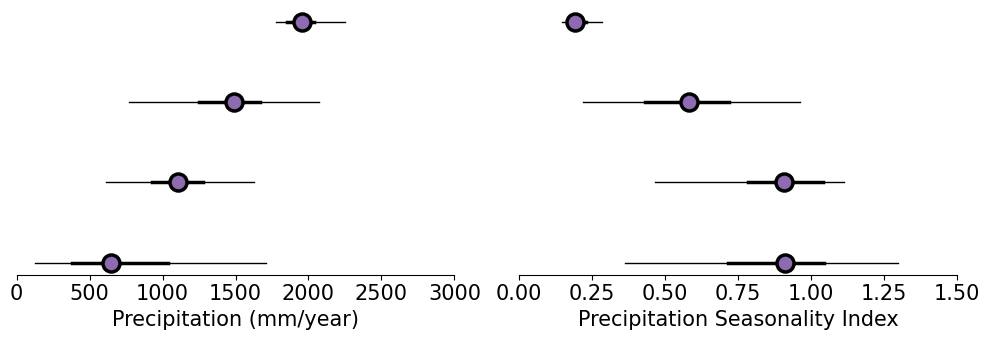

In [62]:
fig, ax = plt.subplots(1,2, figsize=(10,3.5))
dataframe_forest = forest_dataframe(AF_lat_min,AF_lat_max,AF_lon_min,AF_lon_max)
dataframe_sav = savanna_dataframe(AF_lat_min,AF_lat_max,AF_lon_min,AF_lon_max)
for i,var in zip([0,1], ['Precip', 'Seasonality']):
    boxplot_custom(3, pd.DataFrame(dataframe_forest[str(var)].where(dataframe_forest['Sr'] <= AF_Sr_lower_threshold).dropna()), ax = ax[i])
    boxplot_custom(2, pd.DataFrame(dataframe_forest[str(var)].where((dataframe_forest['Sr'] > AF_Sr_lower_threshold) & (dataframe_forest['Sr'] < AF_Sr_upper_threshold)).dropna()), ax = ax[i])
    boxplot_custom(1, pd.DataFrame(dataframe_forest[str(var)].where(dataframe_forest['Sr'] >= AF_Sr_upper_threshold).dropna()), ax = ax[i])
    boxplot_custom(0, pd.DataFrame(dataframe_sav[str(var)]), ax = ax[i])

ax[0].set_xlim(0,3000)
ax[1].set_xlim(0,1.5)
ax[0].set_xlabel('Precipitation (mm/year)', fontsize = 15)
ax[1].set_xlabel('Precipitation Seasonality Index', fontsize = 15)
plt.tight_layout()

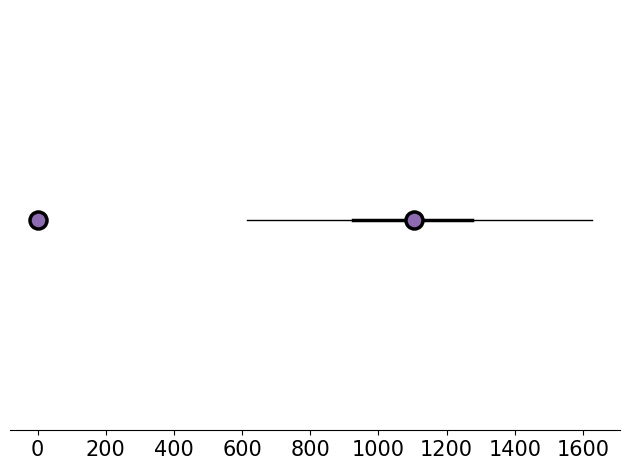

In [63]:
Precip_025,Precip_25,Precip_75,Precip_975 = boxplot_custom(1, pd.DataFrame(dataframe_forest['Precip'].where(dataframe_forest['Sr'] >= AF_Sr_upper_threshold).dropna()))
Seasonality_025,Seasonality_25,Seasonality_75,Seasonality_975 = boxplot_custom(1, pd.DataFrame(dataframe_forest['Seasonality'].where(dataframe_forest['Sr'] >= AF_Sr_upper_threshold).dropna()))

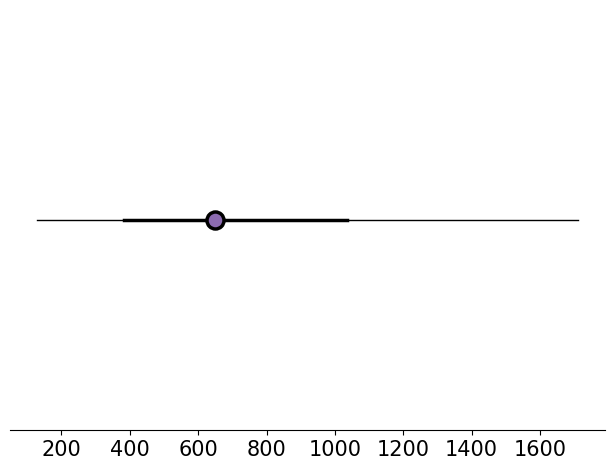

In [64]:
_,_,sav_Precip_75,_ = boxplot_custom(1, pd.DataFrame(dataframe_sav['Precip'].dropna()))

In [65]:
Prec_percentile_025 = dataframe_forest.loc[dataframe_forest['Precip'].sub(Precip_025).abs().idxmin()]['Precip_percentile']
Prec_percentile_25 = dataframe_forest.loc[dataframe_forest['Precip'].sub(Precip_25).abs().idxmin()]['Precip_percentile']

Seasonality_percentile_025 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_025).abs().idxmin()]['Seasonality_percentile']
Seasonality_percentile_975 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_975).abs().idxmin()]['Seasonality_percentile']

In [66]:
sav_Prec_percentile_75 = dataframe_forest.loc[dataframe_forest['Precip'].sub(sav_Precip_75).abs().idxmin()]['Precip_percentile']

Seasonality_percentile_25 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_25).abs().idxmin()]['Seasonality_percentile']
Seasonality_percentile_75 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_75).abs().idxmin()]['Seasonality_percentile']

In [67]:
Sr_sel = Sr.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).values > 0)

---

In [68]:
CMIP6_class_all = {}

for SSP in ['ssp126','ssp245','ssp370','ssp585']:
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    for i in tqdm(range(a_temp.shape[0])):
        os.chdir(parent_dir+'/Sr_estimates/historical/')
        temp_name = 'CMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+'historical'+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        CMIP6_Sr_interp_historical = xr.open_dataset('Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.2000-2014.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_historical = CMIP6_Sr_interp_historical.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), 
                                                                                                          lon = slice(AF_lon_min,AF_lon_max)).values > 0)
        CMIP6_Sr_interp_historical.close()

        os.chdir(parent_dir+'/Sr_estimates/'+SSP+'/')
        temp_name = 'ScenarioMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+SSP+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'MPI-ESM1-2-HR'):
            temp_name = 'ScenarioMIP.'+'DKRZ'+'.'+a_temp.iloc[i,1]+'.'+str(SSP)+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'IITM-ESM'):
            if (SSP == 'ssp370'):
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2098)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
            else:
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2099)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        else:
            CMIP6_Sr_interp_future = xr.open_dataset('Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(future_year_end)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_future = CMIP6_Sr_interp_future.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max),
                                                                                                                                          lon = slice(AF_lon_min,AF_lon_max)).values > 0)
        CMIP6_Sr_interp_future.close()

        """
        ### Saving rootzone storage capacity change as classes 1-9 (forest-savanna tansitions not included)
        """
        CMIP6_Sr_class = {}
        CMIP6_Sr_class['1'] = Sr_sel.where((Sr_sel.values <= AF_Sr_lower_threshold) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,9]))
        CMIP6_Sr_class['2'] = Sr_sel.where((Sr_sel.values <= AF_Sr_lower_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,9]) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,10]))
        CMIP6_Sr_class['3'] = Sr_sel.where((Sr_sel.values <= AF_Sr_lower_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,10]))
        CMIP6_Sr_class['4'] = Sr_sel.where((Sr_sel > AF_Sr_lower_threshold) & (Sr_sel <= AF_Sr_upper_threshold) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,9]))
        CMIP6_Sr_class['5'] = Sr_sel.where((Sr_sel > AF_Sr_lower_threshold) & (Sr_sel <= AF_Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,9]) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,10]))
        CMIP6_Sr_class['6'] = Sr_sel.where((Sr_sel > AF_Sr_lower_threshold) & (Sr_sel <= AF_Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,10]))
        CMIP6_Sr_class['7'] = Sr_sel.where((Sr_sel > AF_Sr_upper_threshold) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,9]))
        CMIP6_Sr_class['8'] = Sr_sel.where((Sr_sel > AF_Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,9]) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,10]))
        CMIP6_Sr_class['9'] = Sr_sel.where((Sr_sel > AF_Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,10]))

        for class_number in range(1,10):
            CMIP6_Sr_class[str(class_number)] = (CMIP6_Sr_class[str(class_number)].fillna(0)/CMIP6_Sr_class[str(class_number)].fillna(0))*class_number
        CMIP6_Sr_class = (CMIP6_Sr_class['1'].fillna(0)+CMIP6_Sr_class['2'].fillna(0)+CMIP6_Sr_class['3'].fillna(0)+CMIP6_Sr_class['4'].fillna(0)+CMIP6_Sr_class['5'].fillna(0)+CMIP6_Sr_class['6'].fillna(0)+
                          CMIP6_Sr_class['7'].fillna(0)+CMIP6_Sr_class['8'].fillna(0)+CMIP6_Sr_class['9'].fillna(0))
        CMIP6_Sr_class = CMIP6_Sr_class.where(CMIP6_Sr_class > 0)
        CMIP6_class_all[SSP+'.'+str(a_temp.iloc[i,1])] = CMIP6_Sr_class

100%|██████████| 30/30 [00:02<00:00, 10.67it/s]


In [69]:
#Interesting trends-4,5,15,22

AF_CMIP6_class_all_forest_savanna_corrected = {}
for SSP in ['ssp126','ssp245','ssp370','ssp585']:
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    for i in tqdm(range(a_temp.shape[0])):
        CMIP6_Sr_class = CMIP6_class_all[SSP+'.'+a_temp.iloc[i,1]]
        # -----------
        os.chdir(parent_dir+'/Sr_estimates/historical/')
        temp_name = 'CMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+'historical'+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        CMIP6_Sr_interp_historical = xr.open_dataset('Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.2000-2014.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_historical = CMIP6_Sr_interp_historical.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), 
                                                                                                              lon = slice(AF_lon_min,AF_lon_max)).values > 0)
        CMIP6_Sr_interp_historical.close()

        CMIP6_prec_historical = 0
        CMIP6_prec_historical = (CMIP6_datasets['pr'][temp_name]).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max), time = slice(str(historical_year_start),str(historical_year_end))).pr[0]
        CMIP6_prec_yearly_historical = CMIP6_prec_historical*sum_of_day(historical_year_start,historical_year_end,CMIP6_prec_historical.shape[1],CMIP6_prec_historical.shape[2])
        CMIP6_prec_monthly_historical_mean = (CMIP6_prec_yearly_historical.groupby('time.month').mean('time'))
        CMIP6_prec_yearly_historical_mean = (CMIP6_prec_yearly_historical.groupby('time.month').mean('time')).sum(axis = 0)
        CMIP6_prec_monthly_historical_mean = CMIP6_prec_monthly_historical_mean.values

        CMIP6_evap_historical = 0
        CMIP6_evap_historical = (CMIP6_datasets['evspsbl'][temp_name]).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max), time = slice(str(historical_year_start),str(historical_year_end))).evspsbl[0]
        CMIP6_evap_yearly_historical = CMIP6_evap_historical*sum_of_day(historical_year_start,historical_year_end,CMIP6_evap_historical.shape[1],CMIP6_evap_historical.shape[2])
        CMIP6_evap_yearly_historical_mean = (CMIP6_evap_yearly_historical.groupby('time.month').mean('time')).sum(axis = 0)
        ####

        ####    
        os.chdir(parent_dir+'/Sr_estimates/'+SSP+'/')
        temp_name = 'ScenarioMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+SSP+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'MPI-ESM1-2-HR'):
            temp_name = 'ScenarioMIP.'+'DKRZ'+'.'+a_temp.iloc[i,1]+'.'+str(SSP)+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'IITM-ESM'):
            if (SSP == 'ssp370'):
                #CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2098)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
                future_year_end = 2098
            else:
                future_year_end = 2099
                #CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2099)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_future = xr.open_dataset('Sr-'+str(return_period)+'year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(future_year_end)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_future = CMIP6_Sr_interp_future.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max),
                                                                                                                                              lon = slice(AF_lon_min,AF_lon_max)).values > 0)
        CMIP6_Sr_interp_future.close()


        CMIP6_prec_future = 0
        CMIP6_prec_future = (CMIP6_datasets['pr'][temp_name]).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max), time = slice(str(future_year_start),str(future_year_end))).pr[0]
        CMIP6_prec_monthly_future = CMIP6_prec_future*sum_of_day(future_year_start,future_year_end,CMIP6_prec_future.shape[1],CMIP6_prec_future.shape[2])
        CMIP6_prec_monthly_future_mean = CMIP6_prec_monthly_future.groupby('time.month').mean('time')
        CMIP6_prec_yearly_future_mean = CMIP6_prec_monthly_future_mean.sum(axis = 0)
        CMIP6_prec_monthly_future_mean = CMIP6_prec_monthly_future_mean.values

        CMIP6_evap_future = 0
        CMIP6_evap_future = (CMIP6_datasets['evspsbl'][temp_name]).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max), time = slice(str(future_year_start),str(future_year_end))).evspsbl[0]
        CMIP6_evap_yearly_future = CMIP6_evap_future*sum_of_day(future_year_start,future_year_end,CMIP6_evap_future.shape[1],CMIP6_evap_future.shape[2])
        CMIP6_evap_yearly_future_mean = CMIP6_evap_yearly_future.groupby('time.month').mean('time').sum(axis = 0)
        ####

        Seasonality_historical = calc_Seasonality(CMIP6_prec_monthly_historical_mean)
        Seasonality_future = calc_Seasonality(CMIP6_prec_monthly_future_mean)
        lat = CMIP6_prec_yearly_future_mean.lat.values
        lon = CMIP6_prec_yearly_future_mean.lon.values

        Prec_CHIRPS = xr.open_dataset(org_dir+'/Empirical_data/chirps-v2.0.2000-2012.meanmonthly_p25.nc').precip.sum(axis = 0).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)); Prec_CHIRPS = Prec_CHIRPS.where(Prec_CHIRPS>0)
        #MeanTC_sel = (xr.open_dataset('/home/jovyan/PlanetaryComputerExamples/Paper3/Treecover_MOD44B_2001-2012.nc').treecover.mean(axis = 0)).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
        Seasonality_historical = interp_selfilter(Seasonality_historical, Landuse,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max) 
        Seasonality_future = interp_selfilter(Seasonality_future, Landuse,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        CMIP6_prec_yearly_historical_mean = interp_selfilter(CMIP6_prec_yearly_historical_mean, Landuse,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        CMIP6_prec_yearly_future_mean = interp_selfilter(CMIP6_prec_yearly_future_mean, Landuse,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)

        CMIP6_evap_yearly_historical_mean = interp_selfilter(CMIP6_evap_yearly_historical_mean, Landuse,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        CMIP6_evap_yearly_future_mean = interp_selfilter(CMIP6_evap_yearly_future_mean, Landuse,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)

        dataframe_variables = 0
        dataframe_variables = pd.concat([pd.DataFrame({'Precip_Observed': Prec_CHIRPS.values.flatten()}),
                               pd.DataFrame({'Landuse': Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).values.flatten()}),
                               pd.DataFrame({'Precip_CMIP_hist': CMIP6_prec_yearly_historical_mean.values.flatten()}),
                               pd.DataFrame({'Seasonality_CMIP_hist': Seasonality_historical.values.flatten()})], axis = 1).dropna()


        dataframe_variables = remove_outliers(dataframe_variables, 'Precip_CMIP_hist')
        dataframe_variables = remove_outliers(dataframe_variables, 'Seasonality_CMIP_hist')
        sz = dataframe_variables['Precip_CMIP_hist'].size-1
        dataframe_variables['Precip_percentile'] = dataframe_variables['Precip_CMIP_hist'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)    
        dataframe_variables['Seasonality_percentile'] = dataframe_variables['Seasonality_CMIP_hist'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)  

        Prec_025_percentile_eq = dataframe_variables.loc[dataframe_variables['Precip_percentile'].sub(Prec_percentile_025).abs().idxmin()]['Precip_CMIP_hist']
        Prec_25_percentile_eq = dataframe_variables.loc[dataframe_variables['Precip_percentile'].sub(Prec_percentile_25).abs().idxmin()]['Precip_CMIP_hist']
        Seasonality_025_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_025).abs().idxmin()]['Seasonality_CMIP_hist']
        Seasonality_975_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_975).abs().idxmin()]['Seasonality_CMIP_hist']   

        sav_Prec_75_percentile_eq = dataframe_variables.loc[dataframe_variables['Precip_percentile'].sub(sav_Prec_percentile_75).abs().idxmin()]['Precip_CMIP_hist']
        Seasonality_25_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_25).abs().idxmin()]['Seasonality_CMIP_hist']
        Seasonality_75_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_75).abs().idxmin()]['Seasonality_CMIP_hist']   
        #----------------------------------------------------------
        a = 0
        a = (Forest_savanna_transition(CMIP6_Sr_class.values, CMIP6_prec_yearly_historical_mean, Seasonality_historical, 
                                       CMIP6_prec_yearly_future_mean, Seasonality_future))
        AF_CMIP6_class_all_forest_savanna_corrected[SSP+'.'+str(a_temp.iloc[i,1])] = a
        future_year_end = 2100

100%|██████████| 30/30 [02:37<00:00,  5.26s/it]


In [70]:
Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
Sr_contour = (Sr_sel/Sr_sel).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)

In [71]:
Sr_sel = Sr.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).values > 0)
Sr_contour_AF = (Sr_sel/Sr_sel).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).values > 0)

In [72]:
def barchart_area_classes_combined_plotting(CMIP6_class_all_forest_savanna_corrected, SSP, forest_class, Sr_lower_threshold, Sr_upper_threshold, lat_min, lat_max, lon_min, lon_max, axis_l = 1, ax=None, **kwargs):
    area = []
    a = combined_classification_all_WSf_future(SSP, CMIP6_class_all_forest_savanna_corrected,forest_class)
    Area = xr.open_dataset(org_dir+'Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    High_CI = Area.where(a.values > 0.5).sum().values
    area.append(High_CI)
    Mod_CI = Area.where((a.values > 0.2) & (a.values <= 0.5)).sum().values
    area.append(Mod_CI)
    Low_CI = Area.where(a.values <= 0.2).sum().values
    area.append(Low_CI)
    area = np.array(area)/1000000 ## km2x 10^6
    Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    if forest_class == 'LWSf':
        SR_area = Area.where(Sr_sel.values <= Sr_lower_threshold).sum().values
    if forest_class == 'MWSf':
        SR_area = Area.where((Sr_sel.values > Sr_lower_threshold) & (Sr_sel.values <= Sr_upper_threshold)).sum().values
    if forest_class == 'HWSf':
        SR_area = Area.where(Sr_sel.values > Sr_upper_threshold).sum().values
    if forest_class == 'Tipping':
        SR_area = 0
    
    import matplotlib.patches as patches
    ax = ax or plt.gca()
    a,b,c = area
    color = ['#c2a5cf','#ffafbd','#e1e1e1']
    
    rect0 = patches.Rectangle((0, 0), 10, SR_area/1000000, ec = 'black', lw = 1, **kwargs, hatch="....", fill=False, zorder = 10)
    rect1 = patches.Rectangle((0, 0), 10, a, color = color[0], ec = 'black', lw = 0.5, **kwargs)
    rect2 = patches.Rectangle((0, a), 10, b, color = color[1], ec = 'black', lw = 0.5, **kwargs)
    rect3 = patches.Rectangle((0, a+b), 10, c, color = color[2], ec = 'black', lw = 0.5, **kwargs)
    
    ax.add_patch(rect0)
    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    ax.plot([0,-15],[SR_area/1000000,SR_area/1000000], color = 'black', **kwargs)
    #ax.plot([0,25],[a,a], color = 'black', **kwargs)
    #ax.plot([15,40],[a+b,a+b], color = 'black', **kwargs)

    #ax.set_xlim([-10, 100])
    #ax.set_ylim([-10, 700])
    
    ax.tick_params(axis='both', which='major', labelsize=9)
    ax.get_xaxis().set_ticks([])
    
    if axis_l == 1:
        ax.spines['left'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.yaxis.set_label_position("right")
        ax.set_ylabel(r'Area ($10^{6}$ km$^{2}$)',fontsize = 10)
    if axis_l == 0:
        ax.spines['left'].set_visible(False)
        ax.spines['top'].set_visible(False)
    ax.set_xlim([-3, 10])
    ax.set_ylim([0, 9])
    ax.yaxis.tick_right()

In [73]:
def barchart_area_classes_custom_combined_plotting(CMIP6_class_all_forest_savanna_corrected, SSP, Forest_class_1, Forest_class_2, Forest_class_3, lat_min, lat_max, lon_min, lon_max, axis_l = 1, ax=None, **kwargs):
    area = []
    a = combined_classification_all_WSf_future_custom(SSP, CMIP6_class_all_forest_savanna_corrected, Forest_class_1, Forest_class_2, Forest_class_3)
    Area = xr.open_dataset(org_dir+'Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    High_CI = Area.where(a.values > 0.5).sum().values
    area.append(High_CI)
    Mod_CI = Area.where((a.values > 0.2) & (a.values <= 0.5)).sum().values
    area.append(Mod_CI)
    Low_CI = Area.where(a.values <= 0.2).sum().values
    area.append(Low_CI)
    area = np.array(area)/1000000 ## km2x 10^6

    import matplotlib.patches as patches
    ax = ax or plt.gca()
    color = ['#c2a5cf','#ffafbd','#e1e1e1']

    a,b,c = area
    rect1 = patches.Rectangle((0, 0), 10, a, color = color[0], ec = 'black', lw = 0.5, **kwargs)
    rect2 = patches.Rectangle((0, a), 10, b, color = color[1], ec = 'black', lw = 0.5, **kwargs)
    rect3 = patches.Rectangle((0, a+b), 10, c, color = color[2], ec = 'black', lw = 0.5, **kwargs)
    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    
    ax.tick_params(axis='both', which='major', labelsize=8)
    ax.get_xaxis().set_ticks([])
    
    if axis_l == 1:
        ax.spines['left'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.yaxis.set_label_position("right")
        ax.set_ylabel(r'Area ($10^{6}$ km$^{2}$)',fontsize = 8)
    if axis_l == 0:
        ax.spines['left'].set_visible(False)
        ax.spines['top'].set_visible(False)
    ax.set_xlim([-3, 10])
    ax.set_ylim([0, 9])
    ax.yaxis.tick_right()

In [74]:
def rectangle_combined_plots():
    global zorder
    for x_axis, color in zip([0.706,0.505,0.302,0.100], ['#FFFFFF','#FFFFFF','#FFFFFF','#FFFFFF']):
        """
        rect = plt.Rectangle(
            # (lower-left corner), width, height
            (0.098, x_axis), 0.805, 0.195, fill=False, lw=1.2, 
            transform=fig.transFigure, figure=fig, alpha = 0.6, edgecolor = color, zorder = -10)
        fig.patches.extend([rect])
        """
        rect = plt.Rectangle(
            # (lower-left corner), width, height
            (0.084, x_axis), 0.014, 0.195, lw=1.2, facecolor = color,
            transform=fig.transFigure, figure=fig, alpha = 0.55, edgecolor = color, zorder = -10)
        fig.patches.extend([rect])

In [75]:
def combined_classification_all_WSf_future_custom(SSP,CMIP6_class_all_forest_savanna_corrected, Forest_class_1, Forest_class_2, Forest_class_3):
    i = 0
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lon.values
    for i in range(0,a_temp.shape[0]):
        B = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]]
        C = B.where((B == Forest_class_1) | (B == Forest_class_2) | (B == Forest_class_3))
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/a_temp.shape[0], coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [76]:
def combined_classification_all_WSf_future_custom_1(SSP,CMIP6_class_all_forest_savanna_corrected, Forest_class_1):
    i = 0
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lon.values
    for i in range(0,a_temp.shape[0]):
        B = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]]
        C = B.where((B == Forest_class_1))
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/a_temp.shape[0], coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [77]:
def combined_classification_all_WSf_future_custom_2(SSP,CMIP6_class_all_forest_savanna_corrected, Forest_class_1, Forest_class_2):
    i = 0
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lon.values
    for i in range(0,a_temp.shape[0]):
        B = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]]
        C = B.where((B == Forest_class_1) | (B == Forest_class_2))
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/a_temp.shape[0], coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [78]:
def calc_area_individually(array, lat_min, lat_max, lon_min, lon_max):
    Area = xr.open_dataset(org_dir+'Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    #Area.plot()
    #plt.show()
    #plt.imshow(array)
    #plt.show()
    Area_sum = Area.where(array>0).sum().values
    Area_sum = Area_sum/1000000 ## km2 x 10^6
    return Area_sum 

In [79]:
def transition_overlap(model_agreement, baseline, other_transitions, CMIP6_class_dictionary, lat_min, lat_max, lon_min, lon_max):
    model = model_agreement
    baseline = baseline
    other_transitions = other_transitions
    overlap = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:     
        a_1 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,baseline[0])
        a_1 = a_1.where(a_1 > model).values
        a_1 = a_1/a_1
        a_2 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,baseline[1])
        a_2 = a_2.where(a_2 > model).values
        a_2 = a_2/a_2
        a_3 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,baseline[2])
        a_3 = a_3.where(a_3 > model).values
        a_3 = a_3/a_3
        b = np.nansum([a_1,a_2,a_3], axis = 0)
        #print('Check', np.unique(b))

        o_1 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,other_transitions[0])
        o_1 = o_1.where(o_1 > model).values
        o_1 = o_1/o_1
        o_2 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,other_transitions[1])
        o_2 = o_2.where(o_2 > model).values
        o_2 = o_2/o_2
        o_3 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,other_transitions[2])
        o_3 = o_3.where(o_3 > model).values
        o_3 = o_3/o_3
        o_4 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,other_transitions[3])
        o_4 = o_4.where(o_4 > model).values
        o_4 = o_4/o_4
        o_5 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,other_transitions[4])
        o_5 = o_5.where(o_5 > model).values
        o_5 = o_5/o_5
        o_6 = combined_classification_all_WSf_future_custom_1(SSP, CMIP6_class_dictionary,other_transitions[5])
        o_6 = o_6.where(o_6 > model).values
        o_6 = o_6/o_6
        b_o = np.nansum([o_1,o_2,o_3, o_4, o_5, o_6], axis = 0)
        #print('Check_other', np.unique(b_o))
        b_o_final = np.nansum([b, b_o/b_o], axis = 0)
        #print('Check_final', np.unique(b_o_final))
        #print('Final area', (calc_area_individually(np.where(b_o_final>1,b_o_final,np.nan),lat_min, lat_max, lon_min, lon_max).round(5)))
        overlap.append(calc_area_individually(np.where(b_o_final>1,b_o_final,np.nan),lat_min, lat_max, lon_min, lon_max).round(5))
    return overlap

Sensitivity-Normal (ssp585)
Sensitivity-Normal (ssp370)
Sensitivity-Normal (ssp245)
Sensitivity-Normal (ssp126)


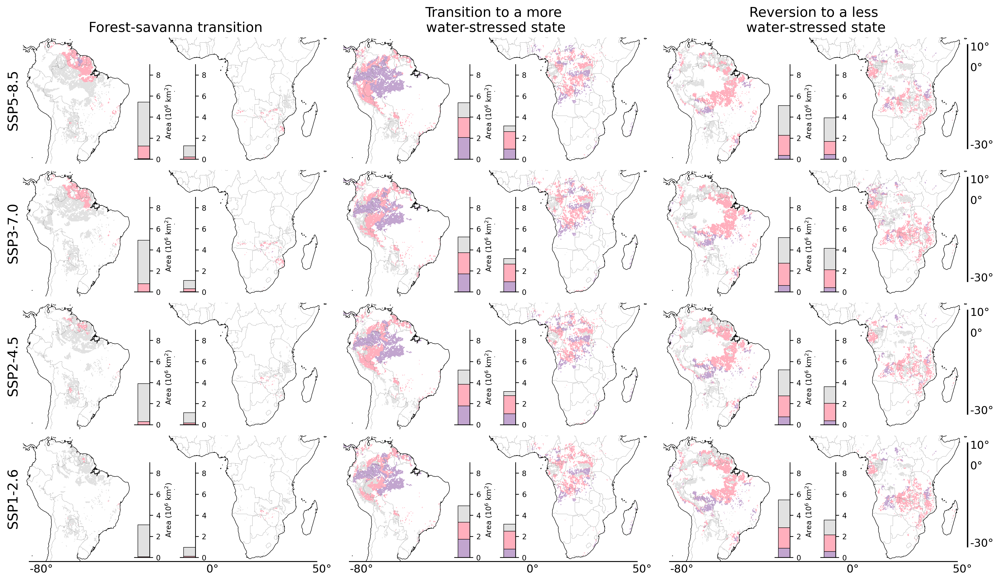

In [80]:
fig = plt.figure(figsize=(18,10), dpi = 300)
ax = [plt.subplot(431,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(432,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(433,projection=ccrs.PlateCarree(), aspect='auto'),
      plt.subplot(434,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(435,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(436,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(437,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(438,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(439,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(4,3,10,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,11,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(4,3,12,projection=ccrs.PlateCarree(), aspect='auto'),]

#rectangle_combined_plots()
colors = ['#e1e1e1','#ffafbd','#c2a5cf']

i = 0
for SSP, SSP_name in zip(['ssp585','ssp370','ssp245','ssp126'],['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6']):
    print('Sensitivity-Normal ('+SSP+')');
    ax[i].text(-87.5, -22, SSP_name, ha='center', fontsize = 15, color = 'black', zorder = 1000, rotation  = 90);
    #ax[i].text(-87.5, -28, SSP_name, zorder = 10000)
    combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,11,12,13).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors,ax = ax[i+0])
    axs = inset_axes(ax[i+0], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.57,0,1,1.5), bbox_transform=ax[i+0].transAxes)
    barchart_area_classes_custom_combined_plotting(SA_CMIP6_class_all_forest_savanna_corrected, SSP,11,12,13, lat_min, lat_max, lon_min, lon_max, ax = axs)
    
    combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,2,3,6).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors, ax = ax[i+1])
    axs = inset_axes(ax[i+1], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.57,0,1,1.5), bbox_transform=ax[i+1].transAxes)
    barchart_area_classes_custom_combined_plotting(SA_CMIP6_class_all_forest_savanna_corrected, SSP, 2,3,6, lat_min, lat_max, lon_min, lon_max, ax = axs)
    
    combined_classification_all_WSf_future_custom(SSP, SA_CMIP6_class_all_forest_savanna_corrected,4,7,8).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors,ax = ax[i+2])
    axs = inset_axes(ax[i+2], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.57,0,1,1.5), bbox_transform=ax[i+2].transAxes)
    barchart_area_classes_custom_combined_plotting(SA_CMIP6_class_all_forest_savanna_corrected, SSP,4,7,8, lat_min, lat_max, lon_min, lon_max, ax = axs)
    
    i = i+2+1 

i = 0
for SSP in ['ssp585','ssp370','ssp245','ssp126']:     
    combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,11,12,13).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors,ax = ax[i+0])
    axs = inset_axes(ax[i+0], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.42,0,1,1.5), bbox_transform=ax[i+0].transAxes)
    barchart_area_classes_custom_combined_plotting(AF_CMIP6_class_all_forest_savanna_corrected, SSP,11,12,13, AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max, ax = axs, axis_l = 0)
    
    combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,2,3,6).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors, ax = ax[i+1])
    axs = inset_axes(ax[i+1], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.42,0,1,1.5), bbox_transform=ax[i+1].transAxes)
    barchart_area_classes_custom_combined_plotting(AF_CMIP6_class_all_forest_savanna_corrected, SSP, 2,3,6, AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max, ax = axs, axis_l = 0)
    
    combined_classification_all_WSf_future_custom(SSP, AF_CMIP6_class_all_forest_savanna_corrected,4,7,8).plot.contourf(vmin = 0, vmax = 1, levels = [0,0.2,0.50,1], add_colorbar=False, 
                                                                                                        colors = colors, ax = ax[i+2])
    axs = inset_axes(ax[i+2], width="5%", height="50%", loc='lower right', bbox_to_anchor=(-0.42,0,1,1.5), bbox_transform=ax[i+2].transAxes)
    barchart_area_classes_custom_combined_plotting(AF_CMIP6_class_all_forest_savanna_corrected, SSP,4,7,8, AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max, ax = axs, axis_l = 0)
    
    i = i+2+1 

for j in range(12):
    ax[j].coastlines(lw = 0.5)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.2, color = 'grey')
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,55.2)
    ax[j].set_ylim(-36,13)

for i in [2,5,8,11]:
    ax[i].plot([55,55],[10,-30], color = 'black', lw = 2)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(56, 0,'0°', fontsize = '12')
    ax[i].text(56, 8,'10°', fontsize = '12')
    ax[i].text(56, -30,'-30°', fontsize = '12')

for i in [9,10,11]:
    ax[i].plot([-80,50],[-36,-36], color = 'black', lw = 2)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(-80,-40,'-80°', fontsize = '12')
    ax[i].text(0,-40,'0°', fontsize = '12')
    ax[i].text(48,-40,'50°', fontsize = '12')
    
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.05, hspace=0.05)

ax[0].set_title('Forest-savanna transition', fontsize = '15', color = 'black');
ax[1].set_title('Transition to a more \nwater-stressed state', fontsize = '15', color = 'black');
ax[2].set_title('Reversion to a less \nwater-stressed state', fontsize = '15', color = 'black');

fig.savefig(parent_dir+str(Sensitivity_id)+'_Supplementary_Fig_Transition_all_unsorted.tif', dpi=300, bbox_inches="tight")

Tipping 15.467107078720113
HWSF 54.73664079735866
Recovery 34.947394514934594
Tipping 0.6851572736458628
HWSF 23.871787365953146
Recovery 10.131956456704842
-----
Tipping 5.3176315130152325
HWSF 51.29527320573508
Recovery 38.25348144412823
Tipping 0.4129385079734198
HWSF 18.795123171205837
Recovery 9.427818589946146
Check these values to set the ylim


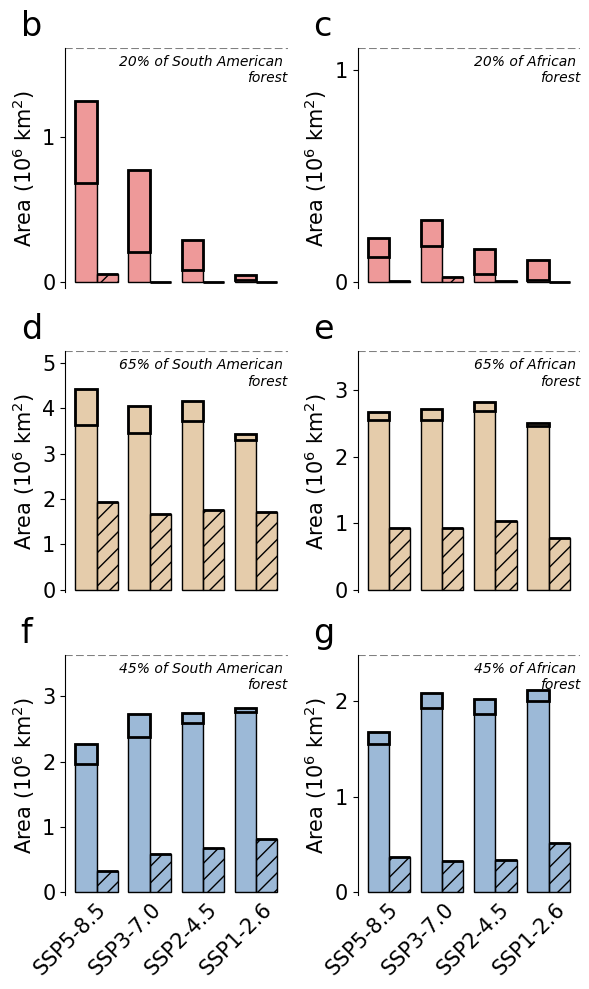

In [81]:
fig, ax = plt.subplots(3,2, figsize=(6,10))
from matplotlib.ticker import ScalarFormatter
class ScalarFormatterForceFormat(ScalarFormatter):
    def _set_format(self):  # Override function that finds format to use.
        self.format = "%1.1f"  # Give format here

colors_tp = '#D60000'
colors_ws = '#BF812D'
colors_wr = '#08519C'

a_axis = []
SA_area = (calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))
#a = []

for model, gap in zip([0.2,0.5], [0,0.4]):
    if model == 0.5:
        hatch = '//'
    else:
        hatch = None
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [11,12,13]:
            b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('Tipping',(a_ind/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
    baseline = [11,12,13]
    other_transitions = [2,3,6, 4,7,8]
    overlap = transition_overlap(model, baseline, other_transitions, SA_CMIP6_class_all_forest_savanna_corrected, 
                       lat_min, lat_max, lon_min, lon_max)
    for i in range(4):
        ax[0][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_tp, alpha = 0.4)
        ax[0][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[0][0].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [2,3,6]:
            b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('HWSF',(a_ind/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
    baseline = [2,3,6]
    other_transitions = [11,12,13, 4,7,8]
    overlap = transition_overlap(model, baseline, other_transitions, SA_CMIP6_class_all_forest_savanna_corrected, 
                       lat_min, lat_max, lon_min, lon_max)
    for i in range(4):
        ax[1][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_ws, alpha = 0.4)
        ax[1][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[1][0].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)

    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [4,7,8]:
            b = combined_classification_all_WSf_future_custom_1(SSP,SA_CMIP6_class_all_forest_savanna_corrected,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,lat_min, lat_max, lon_min, lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('Recovery',(a_ind/(calc_area_individually(Sr_contour.values,lat_min, lat_max, lon_min, lon_max).round(2))*100).max())
    baseline = [4,7,8]
    other_transitions = [11,12,13,2,3,6]
    overlap = transition_overlap(model, baseline, other_transitions, SA_CMIP6_class_all_forest_savanna_corrected, 
                       lat_min, lat_max, lon_min, lon_max)
    for i in range(4):
        ax[2][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_wr, alpha = 0.4)
        ax[2][0].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[2][0].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)

#---------------------------------
print('-----')
AF_area = (calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))
for model, gap in zip([0.2,0.5], [0,0.4]):
    if model == 0.5:
        hatch = '//'
    else:
        hatch = None
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [11,12,13]:
            b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('Tipping',(a_ind/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
    baseline = [11,12,13]
    other_transitions = [2,3,6, 4,7,8]
    overlap = transition_overlap(model, baseline, other_transitions, AF_CMIP6_class_all_forest_savanna_corrected, 
                       AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    for i in range(4):
        ax[0][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_tp, alpha = 0.4)
        ax[0][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[0][1].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
    
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [2,3,6]:
            b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('HWSF',(a_ind/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
    baseline = [2,3,6]
    other_transitions = [11,12,13, 4,7,8]
    overlap = transition_overlap(model, baseline, other_transitions, AF_CMIP6_class_all_forest_savanna_corrected, 
                       AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    for i in range(4):
        ax[1][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_ws, alpha = 0.4)
        ax[1][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[1][1].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
    
    a_ind = []
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        SA = 0
        for i in [4,7,8]:
            b = combined_classification_all_WSf_future_custom_1(SSP,AF_CMIP6_class_all_forest_savanna_corrected,i)
            b = b.where(b > model).values
            SA = SA+calc_area_individually(b,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        a_ind.append(SA)
    a_ind = np.array(a_ind)
    a_axis.append(a_ind.max())
    print('Recovery',(a_ind/(calc_area_individually(Sr_contour_AF.values,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max).round(2))*100).max())
    baseline = [4,7,8]
    other_transitions = [11,12,13,2,3,6]
    overlap = transition_overlap(model, baseline, other_transitions, AF_CMIP6_class_all_forest_savanna_corrected, 
                       AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
    for i in range(4):
        ax[2][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=0.1, color = colors_wr, alpha = 0.4)
        ax[2][1].bar(i+gap, a_ind[i], width=0.4, edgecolor="black", linewidth=1, facecolor = 'None', hatch = hatch)
        ax[2][1].bar(i+gap, overlap[i], width = 0.4, bottom=a_ind[i]-overlap[i], edgecolor="black", linewidth=2, facecolor = 'None', hatch = hatch)
#----------------------------------------
for j in range(2):
    for i in range(3):
        ax[i][j].spines['right'].set_visible(False)
        ax[i][j].spines['top'].set_visible(False)
        ax[i][j].set_ylabel(r'Area ($10^{6}$ km$^{2}$)',fontsize = 15)
        ax[i][j].spines['bottom'].set_visible(False)
        ax[i][j].tick_params(
                    axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
        ax[i][j].tick_params(axis='both', which='major', labelsize=15)
    
#---- South America axes
Tipping_perc = 20
HWSF_perc = 65
Recovery_perc = 45
for j in range(2):
    for i in range(3):
        ax[i][j].set_yticks(np.arange(0, 10, 1))
        
ax[0][0].set_ylim(-SA_area*0.5/100,SA_area*Tipping_perc/100)
ax[0][0].axhline(SA_area*Tipping_perc/100, ls = '--', color = 'grey')
ax[0][0].annotate(str(Tipping_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[1][0].set_ylim(-SA_area*0.5/100,SA_area*HWSF_perc/100)
ax[1][0].axhline(SA_area*HWSF_perc/100, ls = '--', color = 'grey')
ax[1][0].annotate(str(HWSF_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[2][0].set_ylim(-SA_area*0.5/100,SA_area*Recovery_perc/100)
ax[2][0].axhline(SA_area*Recovery_perc/100, ls = '--', color = 'grey')
ax[2][0].annotate(str(Recovery_perc)+'% of South American \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
#---- Africa axes
ax[0][1].set_ylim(-AF_area*0.5/100,AF_area*Tipping_perc/100)
ax[0][1].axhline(AF_area*Tipping_perc/100, ls = '--', color = 'grey')
ax[0][1].annotate(str(Tipping_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[1][1].set_ylim(-AF_area*0.5/100,AF_area*HWSF_perc/100)
ax[1][1].axhline(AF_area*HWSF_perc/100, ls = '--', color = 'grey')
ax[1][1].annotate(str(HWSF_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)
ax[2][1].set_ylim(-AF_area*0.5/100,AF_area*Recovery_perc/100)
ax[2][1].axhline(AF_area*Recovery_perc/100, ls = '--', color = 'grey')
ax[2][1].annotate(str(Recovery_perc)+'% of African \nforest', xy=(1, 0.845), xycoords='axes fraction', style='italic', fontsize=10, ha='right', va='bottom', zorder = 5)

print('Check these values to set the ylim')
for SSP_name,x in zip(['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6'],[0.20,0.45,0.7,0.95]):
    ax[2][0].annotate(SSP_name,xy = (x,-0.35), xycoords='axes fraction',ha='right', va='bottom',rotation = 45, fontsize = 15)
    ax[2][1].annotate(SSP_name,xy = (x,-0.35), xycoords='axes fraction',ha='right', va='bottom',rotation = 45, fontsize = 15)

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.5, hspace=0.15)

import string
axs = ax.flat
for n, ax in enumerate(axs):
    ax.text(-0.20, 1.05, string.ascii_lowercase[n+1], transform=ax.transAxes, 
            size=24)
plt.tight_layout()
fig.savefig(parent_dir+str(Sensitivity_id)+'_Supplementary_Fig_Barplot_return_period.tif', dpi=300, bbox_inches="tight")